## Project Overview: Tamper Detection via Semantic Image Segmentation

This notebook implements a U-Net architecture, fine-tuned with a ResNet50 encoder, to detect pixel-level image forgeries using the CASIA v2 dataset. The model is trained to distinguish between authentic and tampered regions, with applications in digital forensics and content verification.

Key aspects:
- Utilizes transfer learning via a ResNet50 backbone for efficient feature extraction.
- Fine-tunes the full U-Net architecture to optimize segmentation performance on tampered regions.
- Uses Dice coefficient and pixel-wise accuracy to evaluate model quality.
- Systematically explores the impact of hyperparameters (e.g., learning rate, augmentation).
- Visualises segmentation masks overlaid on input images to interpret model predictions and failure cases.

In [1]:
# Install required packages
!/usr/bin/env pip install torch torchvision

In [1]:
import boto3
import os
import sagemaker
import random
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch.optim as optim
import zipfile
import shutil
import torchvision.models as models
import copy
import numpy as np
import math
import pickle
from sagemaker.pytorch import PyTorch, PyTorchModel
from torchvision import transforms
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from torch.utils.data import DataLoader, Dataset, random_split, Subset
from torchvision.datasets import ImageFolder
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR
from torch.optim import Adam, SGD
from tqdm import tqdm
from random import choice
from itertools import product

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/sagemaker-user/.config/sagemaker/config.yaml


In [2]:
# Set up the SageMaker session and role
sagemaker_session = None
role = 'your-sagemaker-role'

In [3]:
# Define the S3 key for the archive and the local paths for extraction
archive_zip_key = 'example-project/casia/archive.zip'
local_extract_path = '/home/sagemaker-user/example-project/'
authentic_path = os.path.join(local_extract_path, 'CASIA2/Au/')
tampered_path = os.path.join(local_extract_path, 'CASIA2/Tp/')
ground_truth_path = os.path.join(local_extract_path, 'CASIA2/CASIA 2 Groundtruth/')

# Create an S3 client
s3_client = boto3.client('s3')
bucket_name = 'your-bucket-name'

In [6]:
def download_and_unzip(s3_key, local_path):
    """
    Downloads a zip file from S3 and extracts it to the specified local path.

    :param s3_key: The S3 key for the zip file
    :param local_path: The local path where the zip file should be extracted
    """
    # Download the zip file to a temporary location
    s3_client.download_file(bucket_name, s3_key, 'temp.zip')

    # Extract the contents of the zip file to the specified local path
    with zipfile.ZipFile('temp.zip', 'r') as zip_ref:
        zip_ref.extractall(local_path)

# Download and unzip the archive
#download_and_unzip(archive_zip_key, local_extract_path)

In [7]:
def count_files(directory):
    """
    Counts the number of files in a directory and its subdirectories.

    :param directory: The directory to count files in
    :return: The number of files in the directory
    """
    return sum([len(files) for subdir, dirs, files in os.walk(directory)])

# Count the number of files in the authentic, tampered, and ground truth directories
authentic_count = count_files(authentic_path)
tampered_count = count_files(tampered_path)
ground_truth_count = count_files(ground_truth_path)

# Print the results
print(f"Number of authentic images: {authentic_count}")
print(f"Number of tampered images: {tampered_count}")
print(f"Number of ground truth images: {ground_truth_count}")

Number of authentic images: 7496
Number of tampered images: 5131
Number of ground truth images: 5125


In [8]:
def upload_to_s3(bucket_name, local_directory, s3_folder):
    """
    Recursively upload a local directory to an S3 bucket.

    Parameters:
    - bucket_name (str): The name of the S3 bucket.
    - local_directory (str): The local directory to be uploaded.
    - s3_folder (str): The target directory in the S3 bucket.

    Returns:
    None
    """
    s3 = boto3.client('s3')
    
    # Iterate over all files in the local directory
    for root, _, files in os.walk(local_directory):
        for file in files:
            local_path = os.path.join(root, file)
            
            # Construct the full S3 path
            relative_path = os.path.relpath(local_path, local_directory)
            s3_path = os.path.join(s3_folder, relative_path)
            
            # Upload the file
            s3.upload_file(local_path, bucket_name, s3_path)
            print(f"Uploaded {local_path} to {s3_path} in {bucket_name}.")

In [6]:
# Paths to original and tampered training and validation images
authentic_path = "/home/sagemaker-user/example-project/CASIA2/Au/"
tampered_path = "/home/sagemaker-user/example-project/CASIA2/Tp/"
ground_truth_path = "/home/sagemaker-user/example-project/CASIA2/CASIA 2 Groundtruth/"

In [10]:
# Function to visualize random images from a given path
def visualize_images(image_path, title_prefix):
    image_names = os.listdir(image_path)
    for img_name in random.sample(image_names, 3):
        img_path = os.path.join(image_path, img_name)
        with Image.open(img_path) as img:
            plt.imshow(img)
            plt.title(f"{title_prefix} - {img_name}")
            plt.axis('off')
            plt.show()

# Function to analyze image dimensions and modes
def analyze_dimensions_modes(image_path):
    image_dims = []
    image_modes = []
    # Only consider files with the following image extensions
    valid_extensions = ['.jpg', '.png', '.jpeg', '.bmp', '.tif', '.tiff']
    image_names = [f for f in os.listdir(image_path) if os.path.isfile(os.path.join(image_path, f)) and any(f.endswith(ext) for ext in valid_extensions)]
    for img_name in image_names:
        img_path = os.path.join(image_path, img_name)
        with Image.open(img_path) as img:
            image_dims.append(img.size)
            image_modes.append(img.mode)
    return set(image_dims), set(image_modes)

# Function to plot pixel intensity for a given image
def plot_pixel_intensity_for_image(img_path, title):
    with Image.open(img_path) as img:
        gray_img = img.convert("L")
        intensities = list(gray_img.getdata())
        plt.hist(intensities, bins=50, alpha=0.7)
        plt.title(title)
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')

# Function to plot class distribution
def plot_class_distribution(original_count, tampered_count, title):
    labels = ['Original', 'Tampered']
    values = [original_count, tampered_count]
    plt.bar(labels, values, color=['blue', 'red'], alpha=0.7)
    plt.xlabel('Category')
    plt.ylabel('Number of Images')
    plt.title(title)
    plt.show()

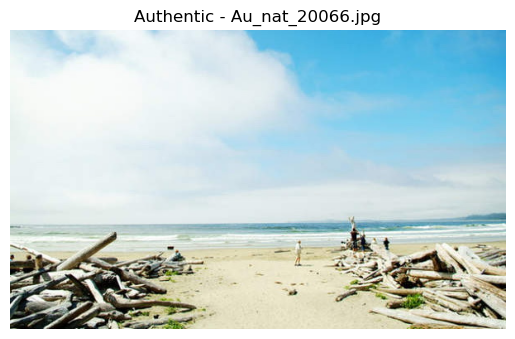

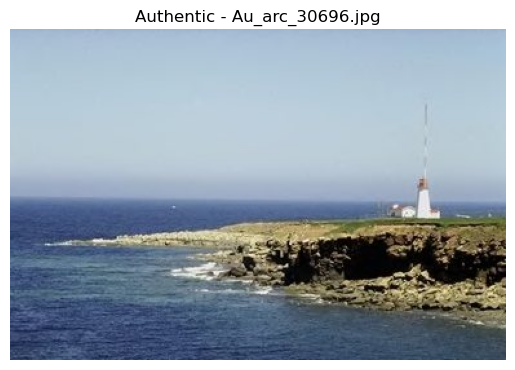

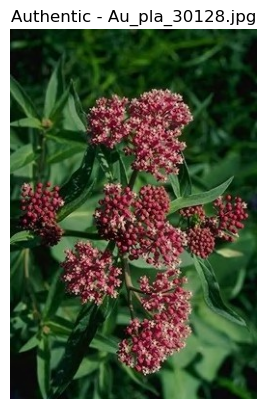

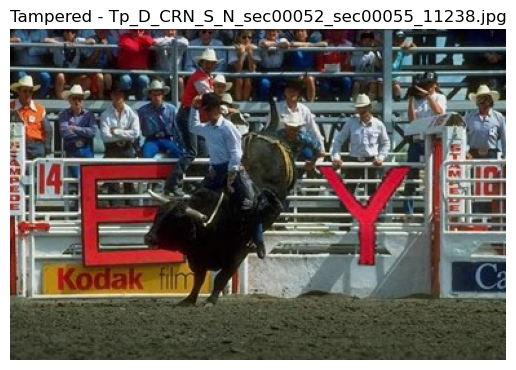

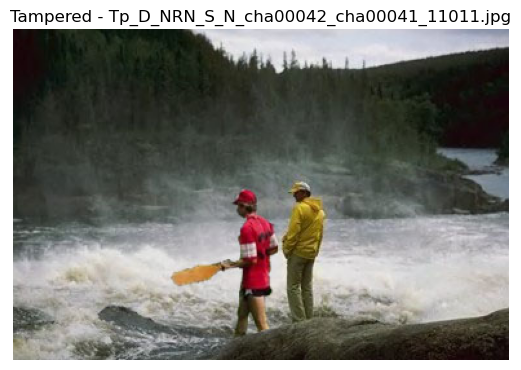

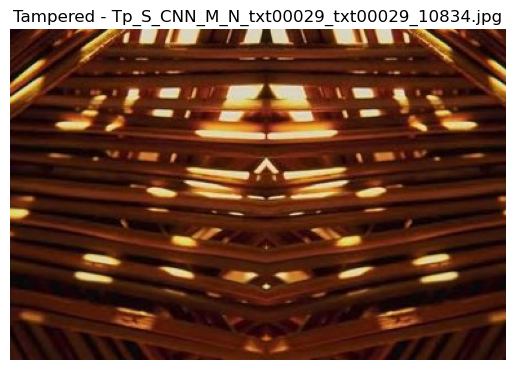

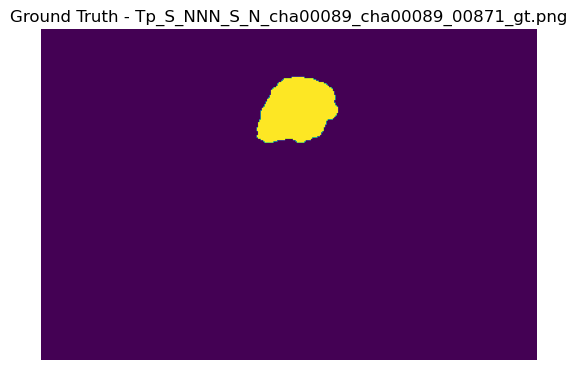

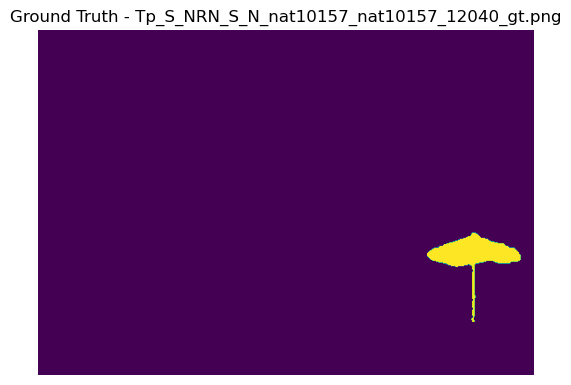

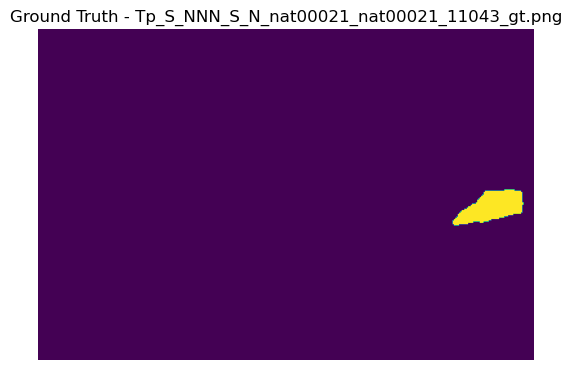

In [11]:
# Visual inspection of training and validation images
visualize_images(authentic_path, "Authentic")
visualize_images(tampered_path, "Tampered")
visualize_images(ground_truth_path, "Ground Truth")

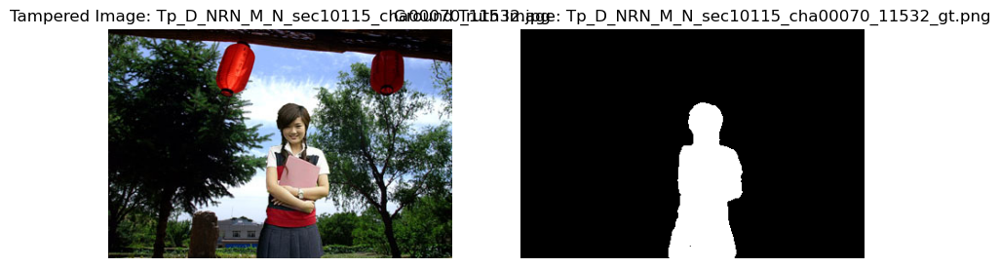

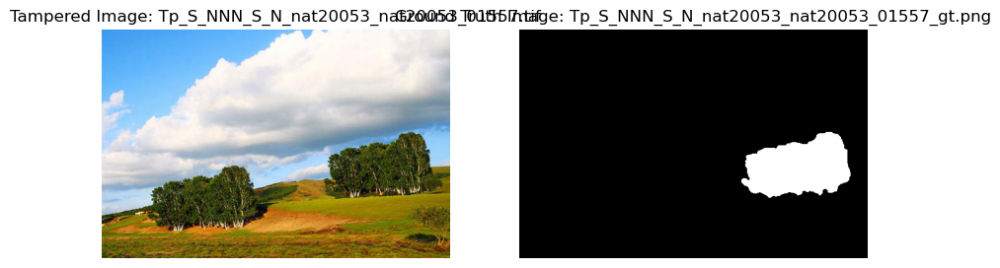

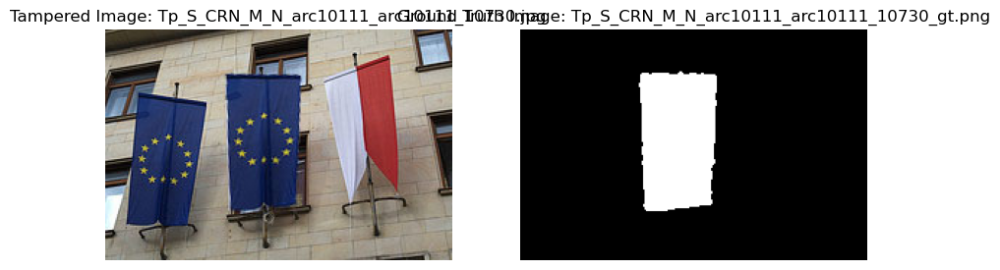

In [12]:
def visualize_random_pairs(tampered_path, ground_truth_path, num_pairs=3):
    """
    Visualizes random pairs of matching tampered images and ground truth images.

    :param tampered_path: Path to the directory containing tampered images
    :param ground_truth_path: Path to the directory containing ground truth images
    :param num_pairs: Number of random pairs to visualize (default is 3)
    """
    # List the filenames of the tampered images
    tampered_images = [f for f in os.listdir(tampered_path) if os.path.isfile(os.path.join(tampered_path, f))]

    # Select random tampered images
    selected_tampered_images = random.sample(tampered_images, num_pairs)

    for tampered_image_name in selected_tampered_images:
        # Construct the paths to the tampered image
        tampered_image_path = os.path.join(tampered_path, tampered_image_name)

        # Construct the corresponding ground truth image name without extension
        ground_truth_image_name_base = tampered_image_name.split('.')[0] + "_gt"

        # Check for the existence of the ground truth image with different extensions
        ground_truth_image_path = None
        for ext in ['jpg', 'jpeg', 'png', 'bmp', 'tif', 'tiff']:
            potential_path = os.path.join(ground_truth_path, ground_truth_image_name_base + '.' + ext)
            if os.path.exists(potential_path):
                ground_truth_image_path = potential_path
                break

        if ground_truth_image_path is None:
            print(f"Ground truth image not found for {tampered_image_name}")
            continue

        # Open the images
        tampered_image = Image.open(tampered_image_path)
        ground_truth_image = Image.open(ground_truth_image_path)

        # Plot the tampered image
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(tampered_image)
        plt.title(f'Tampered Image: {tampered_image_name}')
        plt.axis('off')

        # Plot the ground truth image
        plt.subplot(1, 2, 2)
        plt.imshow(ground_truth_image)
        plt.title(f'Ground Truth Image: {os.path.basename(ground_truth_image_path)}')
        plt.axis('off')

        plt.show()

# Visualize random pairs of matching tampered and ground truth images
visualize_random_pairs(tampered_path, ground_truth_path)

In [14]:
# Get the list of authentic and tampered images
authentic_images = [(os.path.join(authentic_path, img), 0) for img in os.listdir(authentic_path)]
tampered_images = [(os.path.join(tampered_path, img), 1) for img in os.listdir(tampered_path)]

# Combine authentic and tampered images
all_images = authentic_images + tampered_images
random.shuffle(all_images)

# Separate images and labels
images, labels = zip(*all_images)

In [15]:
all_images[:2]

[('/root/Project Darwin/CASIA2/Au/Au_ani_30689.jpg', 0),
 ('/root/Project Darwin/CASIA2/Au/Au_arc_00092.jpg', 0)]

In [15]:
# Split into training, validation, and test sets (60%, 20%, 20%)
train_images, test_images, train_labels, test_labels = train_test_split(images, labels, test_size=0.2, stratify=labels, random_state=42)
train_images, val_images, train_labels, val_labels = train_test_split(train_images, train_labels, test_size=0.25, stratify=train_labels, random_state=42)

In [6]:
# Define data transformations & augmentations
transform = transforms.Compose([
    transforms.Resize(256), # You can adjust the size
    transforms.CenterCrop(224), # You can adjust the crop size
    transforms.ToTensor(),
    # Comment out the normalization to see if it's causing the issue
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10)
])

In [11]:
# Define paths for the datasets
train_dir = '/home/sagemaker-user/example-project/CASIA2/train/'
val_dir = '/home/sagemaker-user/example-project/CASIA2/val/'
test_dir = '/home/sagemaker-user/example-project/CASIA2/test/'

# Create directories for the classes (already done, so don't need to re-run)
'''
for directory in [train_dir, val_dir, test_dir]:
    os.makedirs(os.path.join(directory, 'authentic'), exist_ok=True)
    os.makedirs(os.path.join(directory, 'tampered'), exist_ok=True)
'''

# Function to copy images to the appropriate directories
def copy_images(images, labels, target_dir):
    for image, label in zip(images, labels):
        class_dir = 'authentic' if label == 0 else 'tampered'
        shutil.copy(image, os.path.join(target_dir, class_dir))

# Copy the images to the appropriate directories
#copy_images(train_images, train_labels, train_dir)
#copy_images(val_images, val_labels, val_dir)
#copy_images(test_images, test_labels, test_dir)

In [12]:
# Paths to original and tampered training and validation images
authentic_path = "/home/sagemaker-user/example-project/CASIA2/Au/"
tampered_path = "/home/sagemaker-user/example-project/CASIA2/Tp/"
ground_truth_path = "/home/sagemaker-user/example-project/CASIA2/CASIA 2 Groundtruth/"

In [5]:
# Custom dataset class for segmentation task.
# Dataset consists of authentic and tampered images.
class CASIAv2SegmentationDataset(Dataset):
    def __init__(self, authentic_path, tampered_path, ground_truth_path, transform=None):
        self.authentic_path = authentic_path
        self.tampered_path = tampered_path
        self.ground_truth_path = ground_truth_path
        self.transform = transform
        
        self.authentic_images = [f for f in os.listdir(authentic_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))]
        self.tampered_images = [f for f in os.listdir(tampered_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))]
        
        # Filter out tampered images without ground truth
        self.tampered_images = [img for img in self.tampered_images if self._has_ground_truth(img)]
        
        self.all_images = [(img, 'authentic') for img in self.authentic_images] + \
                          [(img, 'tampered') for img in self.tampered_images]
        
    def _has_ground_truth(self, img_name):
        gt_name = os.path.splitext(img_name)[0] + "_gt"
        for ext in ['.png', '.jpg', '.jpeg', '.tif', '.bmp']:
            if os.path.exists(os.path.join(self.ground_truth_path, gt_name + ext)):
                return True
        return False
        
    def __len__(self):
        return len(self.all_images)
    '''
    def __getitem__(self, idx):
        img_name, img_type = self.all_images[idx]
        
        if img_type == 'authentic':
            img_path = os.path.join(self.authentic_path, img_name)
            image = Image.open(img_path).convert('RGB')
            mask = Image.new('L', image.size, 0)  # Create a blank mask for authentic images
        else:
            img_path = os.path.join(self.tampered_path, img_name)
            image = Image.open(img_path).convert('RGB')
            
            # Find the corresponding ground truth image
            gt_name = os.path.splitext(img_name)[0] + "_gt"
            gt_path = None
            for ext in ['.png', '.jpg', '.jpeg', '.tif', '.bmp']:
                potential_path = os.path.join(self.ground_truth_path, gt_name + ext)
                if os.path.exists(potential_path):
                    gt_path = potential_path
                    break
            
            if gt_path is None:
                print(f"Warning: Ground truth image not found for {img_name}. Using blank mask.")
                mask = Image.new('L', image.size, 0)
            else:
                mask = Image.open(gt_path).convert('L')
        
        # Convert mask to binary
        mask = np.array(mask)
        mask = (mask > 0).astype(np.float32)
        
        if self.transform:
            image = self.transform(image)
            mask = self.transform(Image.fromarray(mask))
        
        return image, mask
    '''
    def __getitem__(self, idx):
        img_name, img_type = self.all_images[idx]
    
        if img_type == 'authentic':
            img_path = os.path.join(self.authentic_path, img_name)
            image = Image.open(img_path).convert('RGB')
            mask = Image.new('L', image.size, 0)  # Create a blank mask for authentic images
        else:
            img_path = os.path.join(self.tampered_path, img_name)
            image = Image.open(img_path).convert('RGB')
        
            # Find the corresponding ground truth image
            gt_name = os.path.splitext(img_name)[0] + "_gt"
            gt_path = None
            for ext in ['.png', '.jpg', '.jpeg', '.tif', '.bmp']:
                potential_path = os.path.join(self.ground_truth_path, gt_name + ext)
                if os.path.exists(potential_path):
                    gt_path = potential_path
                    break
        
            if gt_path is None:
                print(f"Warning: Ground truth image not found for {img_name}. Using blank mask.")
                mask = Image.new('L', image.size, 0)
            else:
                mask = Image.open(gt_path).convert('L')
                
            # Resize both image and mask
        resize_transform = transforms.Resize((256, 256))
        image = resize_transform(image)
        mask = resize_transform(mask)
    
        # Convert mask to binary
        mask = np.array(mask)
        mask = (mask > 0).astype(np.float32)

        # Apply transforms only to the image, not the mask
        if self.transform:
            image = self.transform(image)  # Apply full transformation including normalization to the image
            mask = transforms.ToTensor()(Image.fromarray(mask))  # Convert mask to tensor without normalization
    
        return image, mask

In [8]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create the full dataset
full_dataset = CASIAv2SegmentationDataset(
    authentic_path="/home/sagemaker-user/example-project/CASIA2/Au/",
    tampered_path="/home/sagemaker-user/example-project/CASIA2/Tp/",
    ground_truth_path="/home/sagemaker-user/example-project/CASIA2/CASIA 2 Groundtruth/",
    transform=transform
)

In [29]:
full_dataset

In [22]:
len(full_dataset)

12472

In [30]:
# Create indices for train, validation, and test sets
dataset_size = len(full_dataset)
indices = list(range(dataset_size))
random.shuffle(indices)

train_split = int(0.7 * dataset_size)
val_split = int(0.15 * dataset_size)

train_indices = indices[:train_split]
val_indices = indices[train_split:train_split+val_split]
test_indices = indices[train_split+val_split:]

# Create Subset datasets
train_dataset = Subset(full_dataset, train_indices)
val_dataset = Subset(full_dataset, val_indices)
test_dataset = Subset(full_dataset, test_indices)

In [31]:
# Define the directory where you want to save the datasets
save_dir = "/home/sagemaker-user/example-project/datasets/"

# Create the directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# Save train_dataset
with open(os.path.join(save_dir, "train_dataset.pkl"), "wb") as f:
    pickle.dump(train_dataset, f)

# Save val_dataset
with open(os.path.join(save_dir, "val_dataset.pkl"), "wb") as f:
    pickle.dump(val_dataset, f)

# Save test_dataset
with open(os.path.join(save_dir, "test_dataset.pkl"), "wb") as f:
    pickle.dump(test_dataset, f)

print("Datasets saved successfully.")

Datasets saved successfully.


## START FROM HERE if using saved training, validation and test sets

In [6]:
# Define the directory where you saved the datasets
save_dir = "/home/sagemaker-user/"

# Load train_dataset
with open(os.path.join(save_dir, "train_dataset.pkl"), "rb") as f:
    train_dataset = pickle.load(f)

# Load val_dataset
with open(os.path.join(save_dir, "val_dataset.pkl"), "rb") as f:
    val_dataset = pickle.load(f)

# Load test_dataset
with open(os.path.join(save_dir, "test_dataset.pkl"), "rb") as f:
    test_dataset = pickle.load(f)

print("Datasets loaded successfully.")

Datasets loaded successfully.


In [15]:
test_dataset

Training set pairs:


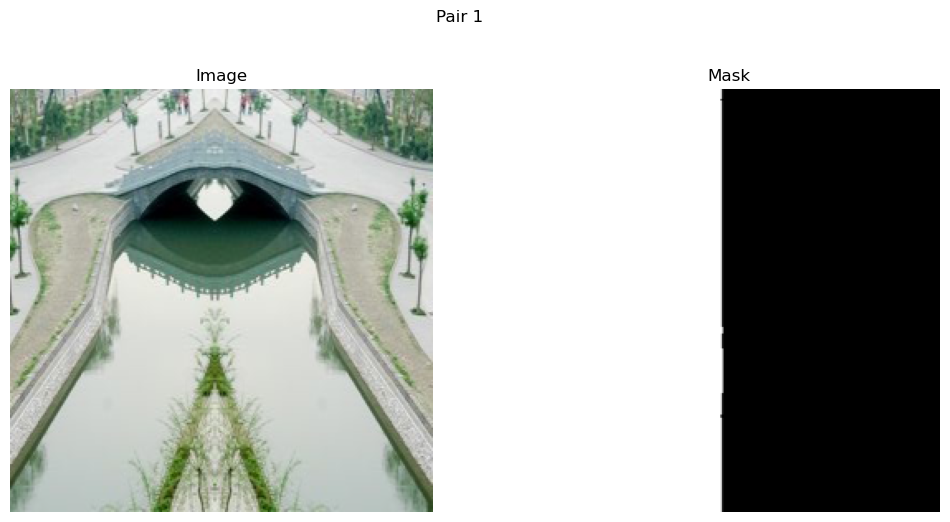

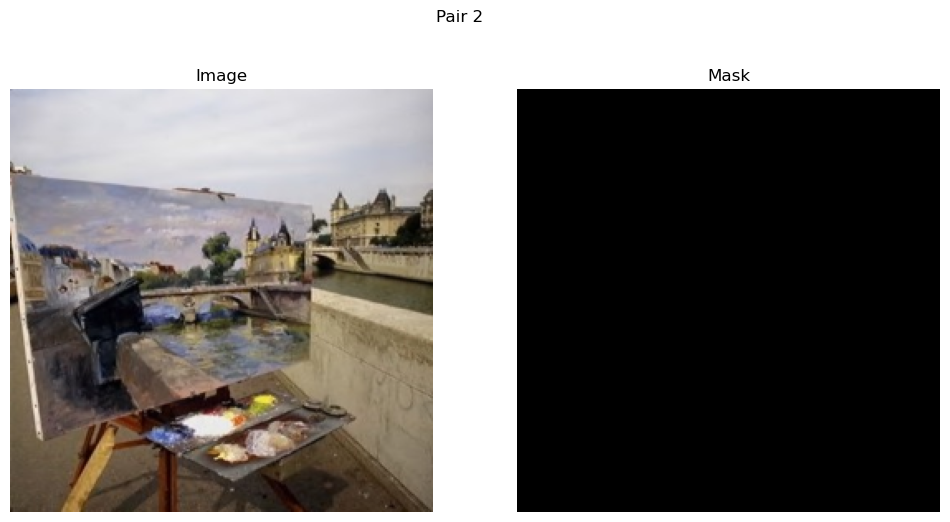

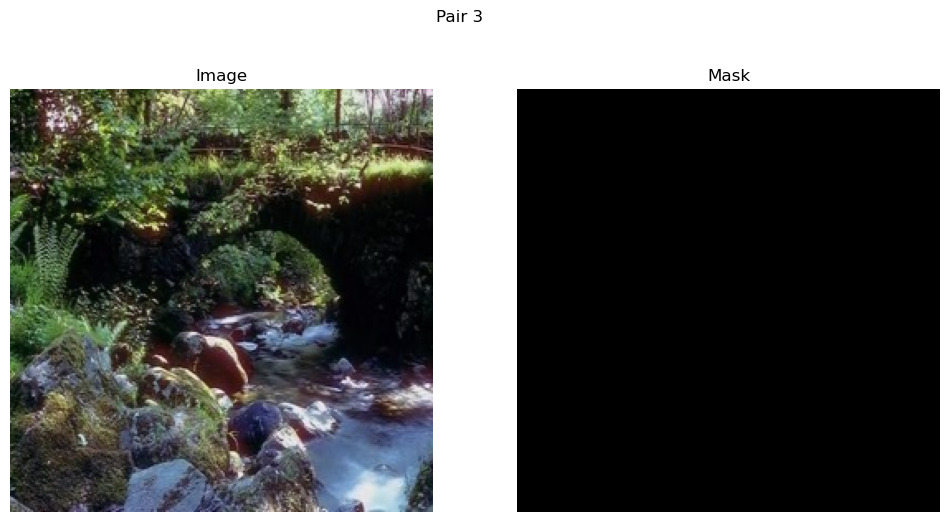


Validation set pairs:


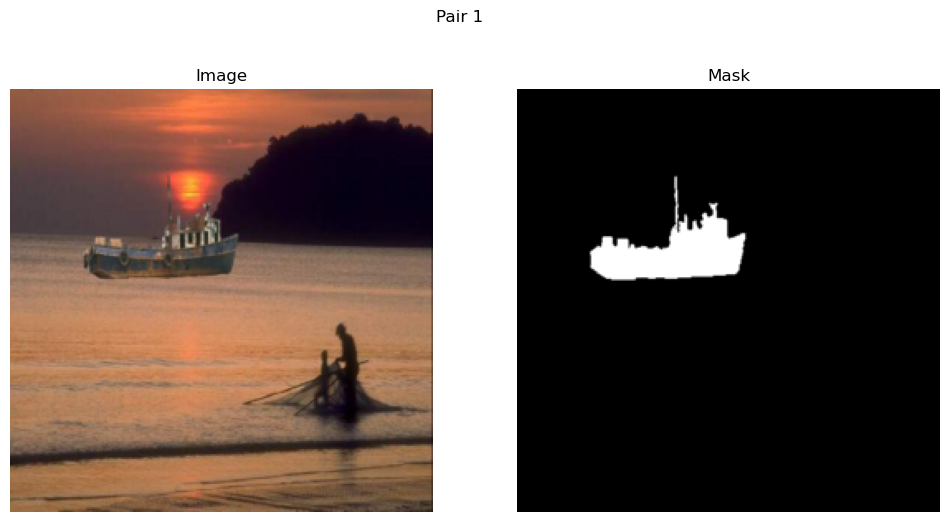

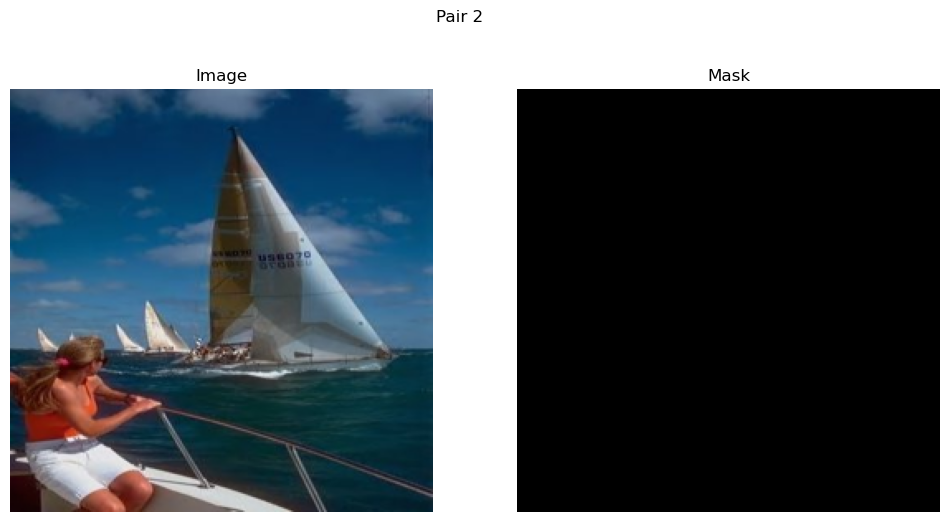

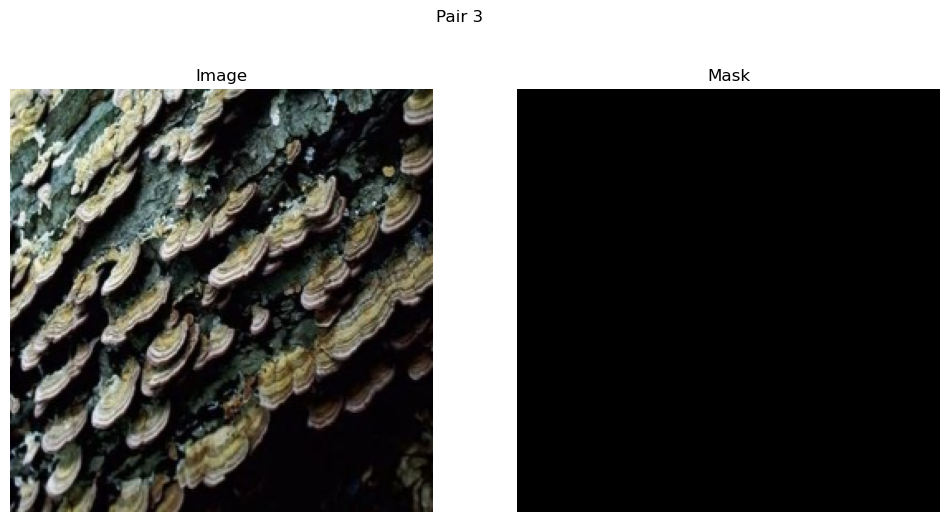


Test set pairs:


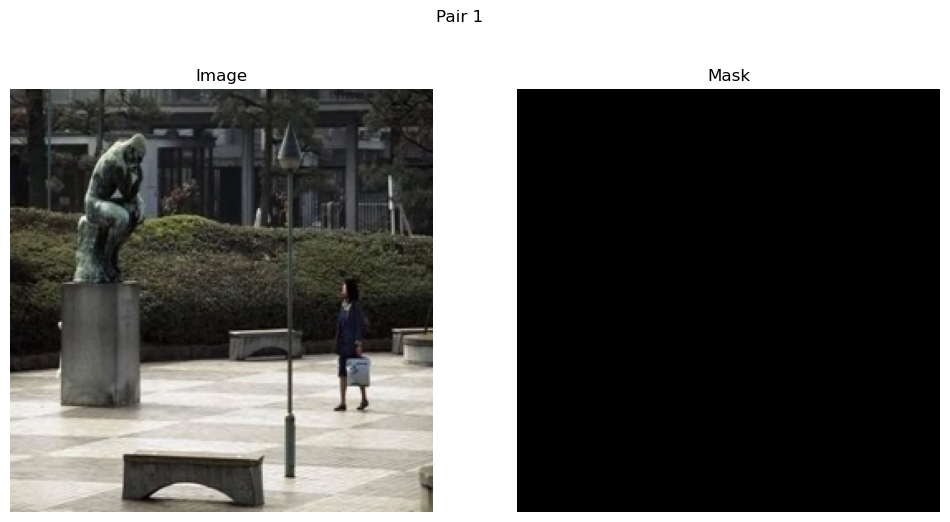

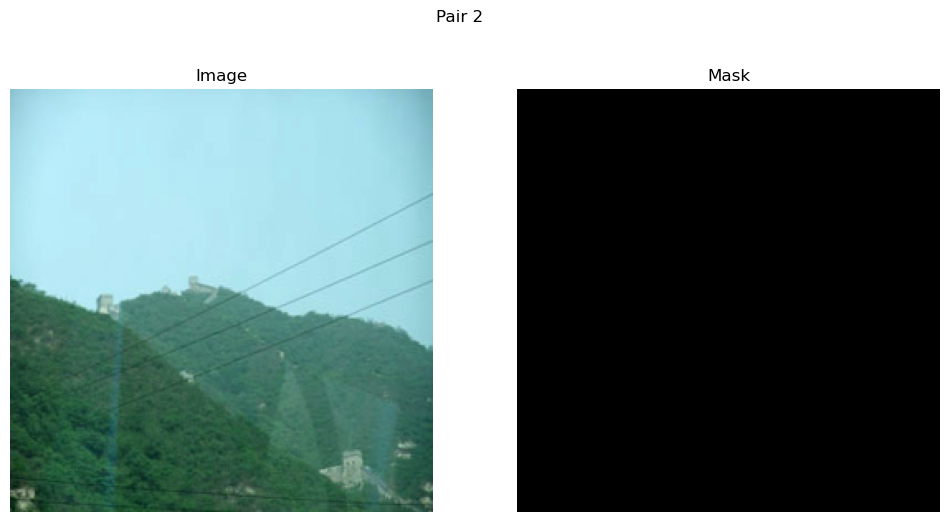

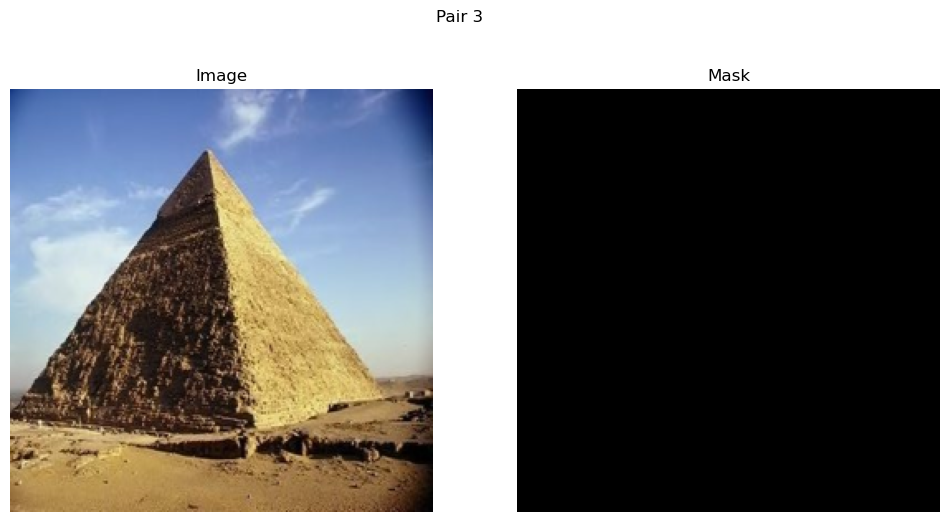


Dataset sizes:
Training set: 8730
Validation set: 1870
Test set: 1872


In [31]:
# Display a few pairs of images and masks to ensure datasets created correctly
def show_image_mask_pair(dataset, idx, title):
    image, mask = dataset[idx]
    
    # Convert tensors to numpy arrays and transpose to (H, W, C) for plotting
    image = image.numpy().transpose(1, 2, 0)
    mask = mask.numpy().squeeze()

    # Normalize image for display
    image = (image - image.min()) / (image.max() - image.min())

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(title)

    ax1.imshow(image)
    ax1.set_title('Image')
    ax1.axis('off')

    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Mask')
    ax2.axis('off')

    plt.show()

# Function to display multiple pairs from a dataset
def display_pairs(dataset, num_pairs=3):
    indices = torch.randperm(len(dataset))[:num_pairs]
    for i, idx in enumerate(indices):
        show_image_mask_pair(dataset, idx.item(), f'Pair {i+1}')

# Display pairs from each dataset
print("Training set pairs:")
display_pairs(train_dataset)

print("\nValidation set pairs:")
display_pairs(val_dataset)

print("\nTest set pairs:")
display_pairs(test_dataset)

# Additional check: print the lengths of each set
print(f"\nDataset sizes:")
print(f"Training set: {len(train_dataset)}")
print(f"Validation set: {len(val_dataset)}")
print(f"Test set: {len(test_dataset)}")

### Custom U-Net Model Class

In [7]:
class UNetWithFineTunedResNetEncoder(nn.Module):
    def __init__(self, fine_tuned_model_path, n_classes=1):
        super().__init__()
        
        # Load your fine-tuned ResNet50 model
        resnet = models.resnet50(weights=None)
        num_ftrs = resnet.fc.in_features
        resnet.fc = nn.Linear(num_ftrs, 2)  # Same structure as fine-tuned model
        resnet.load_state_dict(torch.load(fine_tuned_model_path, map_location=torch.device('cpu'), weights_only=True))
        
        # Remove the final fully connected layer
        self.encoder = nn.Sequential(*list(resnet.children())[:-2])
        
        # Decoder (upsampling)
        self.decoder = nn.ModuleList([
            self._decoder_block(2048, 1024),
            self._decoder_block(1024, 512),
            self._decoder_block(512, 256),
            self._decoder_block(256, 64),
            nn.Sequential(
                nn.Conv2d(64, 64, kernel_size=3, padding=1),
                nn.BatchNorm2d(64),
                nn.ReLU(inplace=True),
                nn.Conv2d(64, n_classes, kernel_size=1) # Output segmentation mask
            )
        ])
        
        # Add 1x1 convolutions to adjust the number of channels for skip connections
        self.skip_convs = nn.ModuleList([
            nn.Conv2d(2048, 1024, kernel_size=1),
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.Conv2d(512, 256, kernel_size=1),
            nn.Conv2d(256, 64, kernel_size=1)
        ])
        
    def _decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(out_channels, out_channels, kernel_size=2, stride=2)
        )
    
    def forward(self, x):
        input_size = x.size()[2:]  # Store original input size
        
        # Encoder
        encoder_features = []
        for i, layer in enumerate(self.encoder):
            x = layer(x)
            if i in [4, 5, 6, 7]:  # Collect features from these layers
                encoder_features.append(x)
        
        # Decoder
        for i, decoder_layer in enumerate(self.decoder[:-1]):
            x = decoder_layer(x)
            enc_features = self.skip_convs[i](encoder_features[-(i+1)])
            enc_features = F.interpolate(enc_features, size=x.shape[2:], mode='bilinear', align_corners=False)
            x = x + enc_features  # Use addition instead of concatenation
        
        x = self.decoder[-1](x)  # Final layer
        
        # Upsample to match input size
        x = F.interpolate(x, size=input_size, mode='bilinear', align_corners=False)
        
        return torch.sigmoid(x)

### Grid Search - Tuning Round 1

In [41]:
# Hyperparameters
learning_rates = [0.0001]
batch_sizes = [16]
num_epochs_list = [20]

# Initialize variables to store best model and validation loss
best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'segmentation_tuning_1'
best_model_path = f"/home/sagemaker-user/example-project/best_segmentation_model_{tuning_round}.pth"
fine_tuned_model_path = "/home/sagemaker-user/example-project/best_model_tuning_8.pth"  # Path to your fine-tuned model

# Grid Search
for lr, batch_size, num_epochs in product(learning_rates, batch_sizes, num_epochs_list):
    print(f"Training with lr={lr}, batch_size={batch_size}, num_epochs={num_epochs}")

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Model
    model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Loss and Optimizer
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        model.train()

        # Training loop with tqdm
        train_loop = tqdm(train_loader, leave=True)
        for images, masks in train_loop:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()
        val_loss = 0
        val_loop = tqdm(val_loader, leave=True)
        with torch.no_grad():
            for images, masks in val_loop:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_model_wts = copy.deepcopy(best_model.state_dict())
        torch.save(best_model_wts, best_model_path)
        best_hyperparams = {'lr': lr, 'batch_size': batch_size, 'num_epochs': num_epochs}

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")

Training with lr=0.0001, batch_size=16, num_epochs=20
Epoch 1/20


100%|██████████| 117/117 [00:39<00:00,  2.94it/s, val_loss=0.181]


Epoch 1/20, Validation Loss: 0.2125371874142916
Epoch 2/20


100%|██████████| 117/117 [00:24<00:00,  4.85it/s, val_loss=0.105] 


Epoch 2/20, Validation Loss: 0.14685888983245587
Epoch 3/20


100%|██████████| 117/117 [00:23<00:00,  4.89it/s, val_loss=0.0836]


Epoch 3/20, Validation Loss: 0.1264169390639688
Epoch 4/20


100%|██████████| 117/117 [00:23<00:00,  4.90it/s, val_loss=0.069] 


Epoch 4/20, Validation Loss: 0.120418734020657
Epoch 5/20


100%|██████████| 117/117 [00:24<00:00,  4.86it/s, val_loss=0.0571]


Epoch 5/20, Validation Loss: 0.11135752371743195
Epoch 6/20


100%|██████████| 117/117 [00:23<00:00,  4.88it/s, val_loss=0.0537]


Epoch 6/20, Validation Loss: 0.10373918446274395
Epoch 7/20


100%|██████████| 117/117 [00:24<00:00,  4.83it/s, val_loss=0.0423]


Epoch 7/20, Validation Loss: 0.096277434601743
Epoch 8/20


100%|██████████| 117/117 [00:23<00:00,  4.90it/s, val_loss=0.0476]


Epoch 8/20, Validation Loss: 0.09895393704501991
Epoch 9/20


100%|██████████| 117/117 [00:24<00:00,  4.85it/s, val_loss=0.0452]


Epoch 9/20, Validation Loss: 0.09611684057670526
Epoch 10/20


100%|██████████| 117/117 [00:23<00:00,  4.88it/s, val_loss=0.0436]


Epoch 10/20, Validation Loss: 0.0932411777221749
Epoch 11/20


100%|██████████| 117/117 [00:24<00:00,  4.86it/s, val_loss=0.0374]


Epoch 11/20, Validation Loss: 0.09325621130629483
Epoch 12/20


100%|██████████| 117/117 [00:24<00:00,  4.87it/s, val_loss=0.0355]


Epoch 12/20, Validation Loss: 0.08987620689420618
Epoch 13/20


100%|██████████| 117/117 [00:23<00:00,  4.90it/s, val_loss=0.0614]


Epoch 13/20, Validation Loss: 0.12927432300952765
Epoch 14/20


100%|██████████| 117/117 [00:24<00:00,  4.85it/s, val_loss=0.0343]


Epoch 14/20, Validation Loss: 0.09407216594673884
Epoch 15/20


100%|██████████| 117/117 [00:23<00:00,  4.90it/s, val_loss=0.038]  


Epoch 15/20, Validation Loss: 0.0905268153685153
Epoch 16/20


100%|██████████| 117/117 [00:23<00:00,  4.89it/s, val_loss=0.0274]


Epoch 16/20, Validation Loss: 0.08704692184224598
Epoch 17/20


100%|██████████| 117/117 [00:24<00:00,  4.87it/s, val_loss=0.0167]


Epoch 17/20, Validation Loss: 0.08851766228898723
Epoch 18/20


100%|██████████| 117/117 [00:23<00:00,  4.88it/s, val_loss=0.0378]


Epoch 18/20, Validation Loss: 0.08882153635987869
Epoch 19/20


100%|██████████| 117/117 [00:24<00:00,  4.87it/s, val_loss=0.0198]


Epoch 19/20, Validation Loss: 0.08995501343638469
Epoch 20/20


100%|██████████| 117/117 [00:23<00:00,  4.88it/s, val_loss=0.0127]


Epoch 20/20, Validation Loss: 0.09373205147970182
Training completed. Best model saved.
Best Hyperparameters: {'lr': 0.0001, 'batch_size': 16, 'num_epochs': 20}


### Evaluation on Test Set

In [45]:
# Evaluation
# Load custome U-Net model
model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
model.load_state_dict(torch.load(best_model_path, map_location=torch.device('cpu'), weights_only=True))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval() # ensure model in evaluation mode when not training

# Commonly used metric to evaluate image segmentation models.
def iou_score(output, target):
    smooth = 1e-6
    output = output > 0.5
    target = target > 0.5
    intersection = (output & target).float().sum((1, 2, 3))
    union = (output | target).float().sum((1, 2, 3))
    iou = (intersection + smooth) / (union + smooth)
    return iou.mean()

# Commonly used metric to evaluate image segmentation models.
def dice_score(output, target):
    smooth = 1e-6
    output = output > 0.5
    target = target > 0.5
    intersection = (output & target).float().sum((1, 2, 3))
    dice = (2. * intersection + smooth) / (output.float().sum((1, 2, 3)) + target.float().sum((1, 2, 3)) + smooth)
    return dice.mean()

# Load test dataset
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
test_loop = tqdm(test_loader, leave=True)
total_iou = 0
total_dice = 0
total_samples = 0
all_preds = []
all_targets = []

# Predict and evaluate over each batch of test images
with torch.no_grad():
    for images, masks in test_loop:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        
        iou = iou_score(outputs, masks)
        dice = dice_score(outputs, masks)
        
        total_iou += iou.item() * images.size(0)
        total_dice += dice.item() * images.size(0)
        total_samples += images.size(0)
        
        # Convert to binary for precision, recall, and F1 score
        preds = (outputs > 0.5).cpu().numpy().reshape(-1)
        targets = (masks > 0.5).cpu().numpy().reshape(-1)
        all_preds.extend(preds)
        all_targets.extend(targets)
        
        test_loop.set_postfix(IoU=iou.item(), Dice=dice.item())

# Metrics over all test batches
average_iou = total_iou / total_samples
average_dice = total_dice / total_samples
precision = precision_score(all_targets, all_preds)
recall = recall_score(all_targets, all_preds)
f1 = f1_score(all_targets, all_preds)

print(f"Average IoU: {average_iou:.4f}")
print(f"Average Dice Score: {average_dice:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

100%|██████████| 59/59 [00:28<00:00,  2.05it/s, Dice=0.789, IoU=0.778]


Average IoU: 0.6421
Average Dice Score: 0.6531
Precision: 0.6822
Recall: 0.2886
F1 Score: 0.4056


### Display predicted masks

In [ ]:
def visualize_prediction(model, test_dataset, index):
    # Set model to evaluation mode
    model.eval()
    
    # Get a sample from the test dataset
    image, true_mask = test_dataset[index]
    
    # Add batch dimension and move to the same device as the model
    image = image.unsqueeze(0).to(next(model.parameters()).device)
    
    # Get model prediction
    with torch.no_grad():
        pred_mask = model(image)
    
    # Move tensors to CPU and convert to numpy arrays
    image = image.squeeze().cpu().permute(1, 2, 0).numpy()
    true_mask = true_mask.squeeze().cpu().numpy()
    pred_mask = pred_mask.squeeze().cpu().numpy()
    
    # Normalize image for display
    image = (image - image.min()) / (image.max() - image.min())
    
    # Create a figure with three subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    # Plot original image
    axs[0].imshow(image)
    axs[0].set_title('Original Image')
    axs[0].axis('off')
    
    # Plot true mask
    axs[1].imshow(true_mask, cmap='gray')
    axs[1].set_title('True Mask')
    axs[1].axis('off')
    
    # Plot predicted mask
    axs[2].imshow(pred_mask, cmap='gray')
    axs[2].set_title('Predicted Mask')
    axs[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Usage
model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
model.load_state_dict(torch.load(best_model_path, map_location=torch.device('cpu'), weights_only=True))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Visualize prediction for a few test images
for i in range(5):  # Visualize 5 random images
    index = np.random.randint(0, len(test_dataset))
    visualize_prediction(model, test_dataset, index)

### Display predicted masks for predicted tampered images

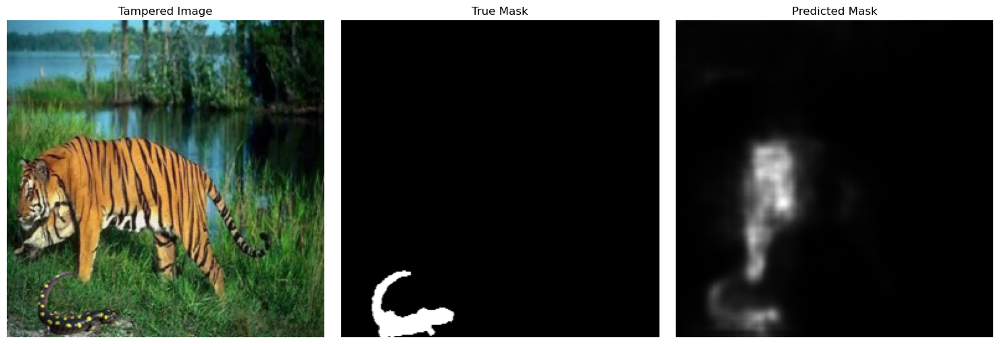

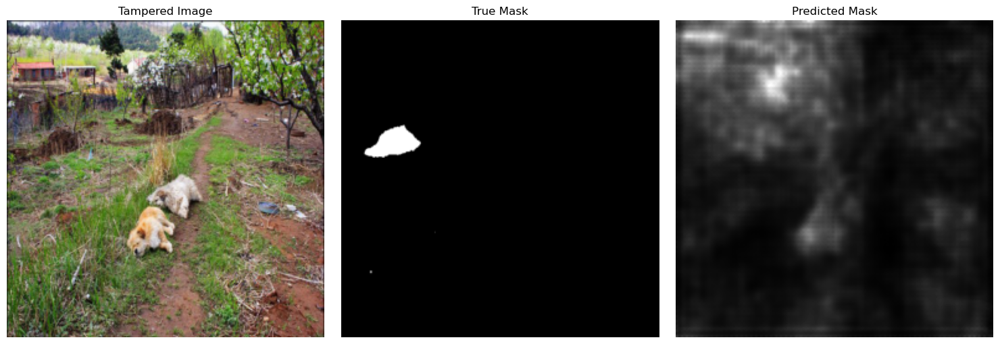

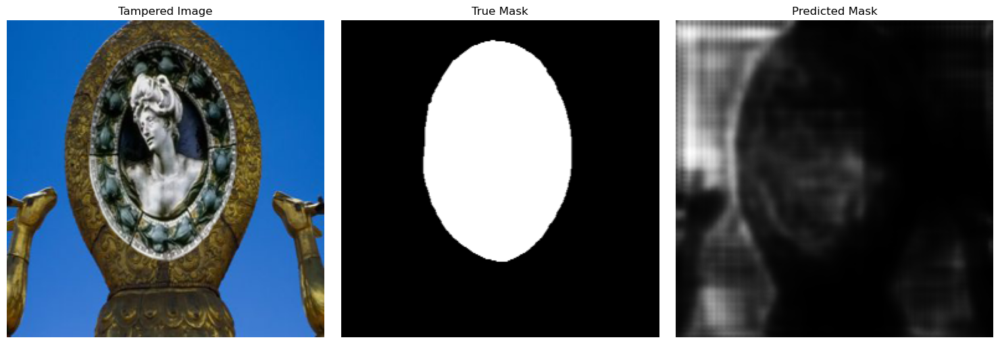

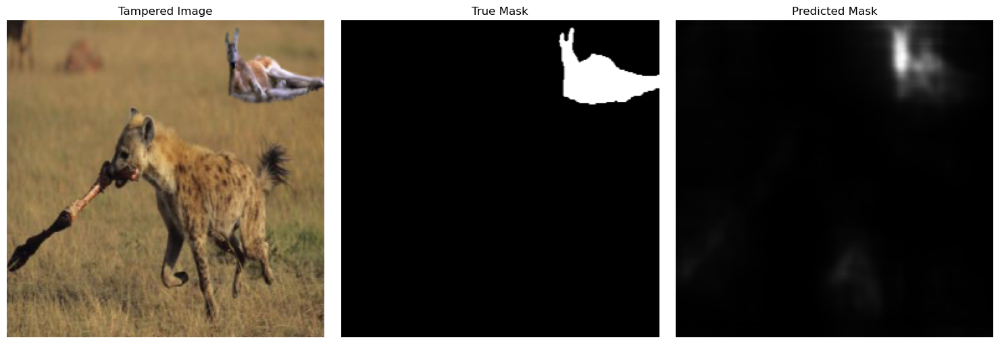

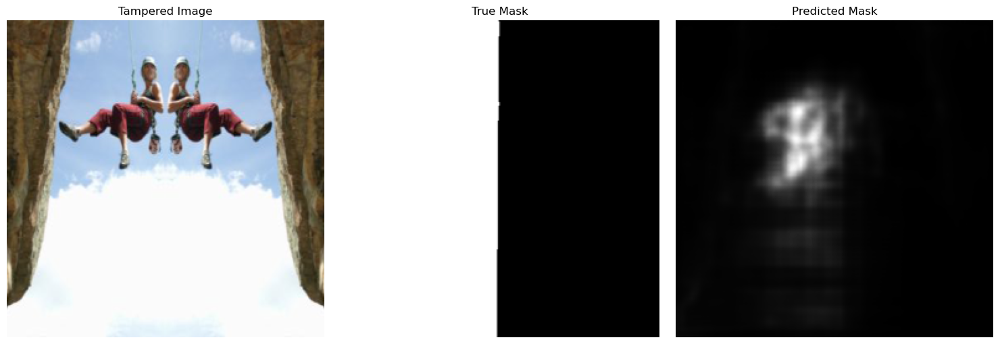

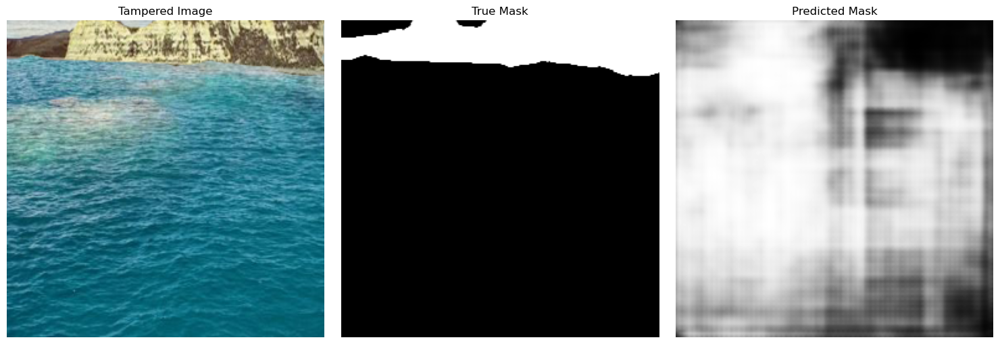

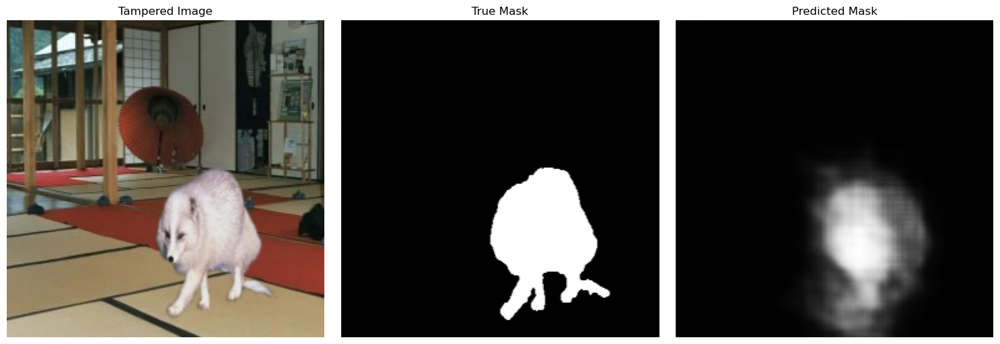

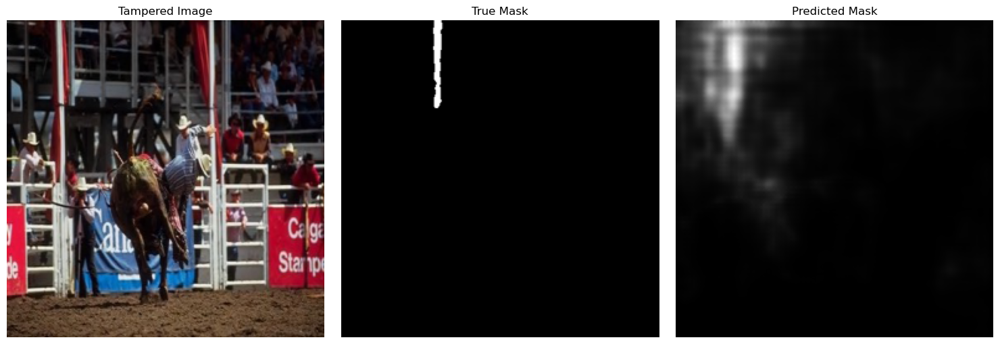

In [23]:
def visualize_tampered_prediction(model, test_dataset, num_images=5):
    # Set model to evaluation mode
    model.eval()
    
    # Find tampered images in the test dataset
    tampered_indices = [i for i in range(len(test_dataset)) if test_dataset[i][1].max() > 0]
    
    # Randomly select num_images tampered images
    selected_indices = np.random.choice(tampered_indices, min(num_images, len(tampered_indices)), replace=False)
    
    for index in selected_indices:
        # Get a sample from the test dataset
        image, true_mask = test_dataset[index]
        
        # Add batch dimension and move to the same device as the model
        image = image.unsqueeze(0).to(next(model.parameters()).device)
        
        # Get model prediction
        with torch.no_grad():
            pred_mask = model(image)
        
        # Move tensors to CPU and convert to numpy arrays
        image = image.squeeze().cpu().permute(1, 2, 0).numpy()
        true_mask = true_mask.squeeze().cpu().numpy()
        pred_mask = pred_mask.squeeze().cpu().numpy()
        
        # Normalize image for display
        image = (image - image.min()) / (image.max() - image.min())
        
        # Create a figure with three subplots
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        
        # Plot original image
        axs[0].imshow(image)
        axs[0].set_title('Tampered Image')
        axs[0].axis('off')
        
        # Plot true mask
        axs[1].imshow(true_mask, cmap='gray')
        axs[1].set_title('True Mask')
        axs[1].axis('off')
        
        # Plot predicted mask
        axs[2].imshow(pred_mask, cmap='gray')
        axs[2].set_title('Predicted Mask')
        axs[2].axis('off')
        
        plt.tight_layout()
        plt.show()

# Usage
model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
model.load_state_dict(torch.load(best_model_path, map_location=torch.device('cpu'), weights_only=True))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Visualize predictions for 5 random tampered images
visualize_tampered_prediction(model, test_dataset, num_images=8)

In [17]:
best_model_path = f"/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_1.pth"
fine_tuned_model_path = "/home/sagemaker-user/example-project/best_model_tuning_8.pth"  # Path to your fine-tuned model

### Grid Search - Training and Validation - Tuning Round 3

In [20]:
# Hyperparameters
learning_rates = [5e-4, 1e-3]
batch_sizes = [32]
num_epochs_list = [20]

# Initialize variables to store best model and validation loss
best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'segmentation_tuning_3'
best_model_path = f"/home/sagemaker-user/example-project/best_segmentation_model_{tuning_round}.pth"
fine_tuned_model_path = "/home/sagemaker-user/example-project/best_model_tuning_8.pth"  # Path to your fine-tuned model

# Grid Search
for lr, batch_size, num_epochs in product(learning_rates, batch_sizes, num_epochs_list):
    print(f"Training with lr={lr}, batch_size={batch_size}, num_epochs={num_epochs}")

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Model
    model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Loss and Optimizer
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        model.train()

        # Training loop with tqdm
        train_loop = tqdm(train_loader, leave=True)
        for images, masks in train_loop:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()
        val_loss = 0
        val_loop = tqdm(val_loader, leave=True)
        with torch.no_grad():
            for images, masks in val_loop:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_model_wts = copy.deepcopy(best_model.state_dict())
        torch.save(best_model_wts, best_model_path)
        best_hyperparams = {'lr': lr, 'batch_size': batch_size, 'num_epochs': num_epochs}

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")

Training with lr=0.0005, batch_size=32, num_epochs=20
Epoch 1/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.0836]


Epoch 1/20, Validation Loss: 0.13368728314921008
Epoch 2/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0653]


Epoch 2/20, Validation Loss: 0.11399974232002841
Epoch 3/20


100%|██████████| 59/59 [00:23<00:00,  2.47it/s, val_loss=0.0615]


Epoch 3/20, Validation Loss: 0.1137422375633555
Epoch 4/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0615]


Epoch 4/20, Validation Loss: 0.1074050644065364
Epoch 5/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.051] 


Epoch 5/20, Validation Loss: 0.10611856008990336
Epoch 6/20


100%|██████████| 59/59 [00:23<00:00,  2.47it/s, val_loss=0.0399]


Epoch 6/20, Validation Loss: 0.09719416139236951
Epoch 7/20


100%|██████████| 59/59 [00:23<00:00,  2.47it/s, val_loss=0.0395]


Epoch 7/20, Validation Loss: 0.10052096426992094
Epoch 8/20


100%|██████████| 59/59 [00:23<00:00,  2.48it/s, val_loss=0.0314]


Epoch 8/20, Validation Loss: 0.10023216612763323
Epoch 9/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0375]


Epoch 9/20, Validation Loss: 0.09299011983103671
Epoch 10/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0495]


Epoch 10/20, Validation Loss: 0.10215297922239465
Epoch 11/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.0335]


Epoch 11/20, Validation Loss: 0.09032762625207336
Epoch 12/20


100%|██████████| 59/59 [00:23<00:00,  2.49it/s, val_loss=0.0425]


Epoch 12/20, Validation Loss: 0.09805754559524989
Epoch 13/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.048] 


Epoch 13/20, Validation Loss: 0.08548327106035362
Epoch 14/20


100%|██████████| 59/59 [00:23<00:00,  2.48it/s, val_loss=0.0475]


Epoch 14/20, Validation Loss: 0.08719600421392311
Epoch 15/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0264]


Epoch 15/20, Validation Loss: 0.0849010526691958
Epoch 16/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.0419]


Epoch 16/20, Validation Loss: 0.08500127879492307
Epoch 17/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0272]


Epoch 17/20, Validation Loss: 0.09549786532455581
Epoch 18/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.039] 


Epoch 18/20, Validation Loss: 0.09070720283661858
Epoch 19/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0177]


Epoch 19/20, Validation Loss: 0.09864710467094082
Epoch 20/20


100%|██████████| 59/59 [00:23<00:00,  2.49it/s, val_loss=0.013] 


Epoch 20/20, Validation Loss: 0.08341582040539232
Training with lr=0.001, batch_size=32, num_epochs=20
Epoch 1/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.0899]


Epoch 1/20, Validation Loss: 0.1308384614728265
Epoch 2/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0686]


Epoch 2/20, Validation Loss: 0.12509683355436488
Epoch 3/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0614]


Epoch 3/20, Validation Loss: 0.12348381549877635
Epoch 4/20


 17%|█▋        | 46/273 [00:37<03:04,  1.23it/s, loss=0.0746]


KeyboardInterrupt: 

### Random Search - Training and Validation - Tuning Round 4

In [ ]:
# Define hyperparameter search spaces
hyperparameters = {
    'learning_rate': [1e-4, 5e-4, 1e-3],
    'batch_size': [16, 32, 64],
    'num_epochs': [20, 30],
    'weight_decay': [0, 1e-5, 1e-4],
    'lr_scheduler': [None, 'step', 'cosine'],
    'optimizer': ['adam', 'sgd'],
    'loss_function': [nn.BCELoss(), nn.BCEWithLogitsLoss()],
    'encoder_freeze': [True, False]
}

# Function to get a random hyperparameter configuration
def get_random_hyperparameters():
    return {k: random.choice(v) for k, v in hyperparameters.items()}

# Number of random searches
n_iter = 3  # Adjust this based on your computational resources and time constraints

# Initialize variables to store best model and validation loss
best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'segmentation_tuning_random_4'
best_model_path = f"/home/sagemaker-user/example-project/best_segmentation_model_{tuning_round}.pth"
fine_tuned_model_path = "/home/sagemaker-user/example-project/best_model_tuning_8.pth"  # Path to your fine-tuned model

# Random Search
for i in range(n_iter):
    hp = get_random_hyperparameters()
    print(f"Training iteration {i+1}/{n_iter} with hyperparameters: {hp}")

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=hp['batch_size'], shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=hp['batch_size'], shuffle=False)

    # Model
    model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
    if hp['encoder_freeze']:
        for param in model.encoder.parameters():
            param.requires_grad = False
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Optimizer
    if hp['optimizer'] == 'adam':
        optimizer = optim.Adam(model.parameters(), lr=hp['learning_rate'], weight_decay=hp['weight_decay'])
    else:
        optimizer = optim.SGD(model.parameters(), lr=hp['learning_rate'], momentum=0.9, weight_decay=hp['weight_decay'])

    # Learning Rate Scheduler
    if hp['lr_scheduler'] == 'step':
        lr_scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    elif hp['lr_scheduler'] == 'cosine':
        lr_scheduler = CosineAnnealingLR(optimizer, T_max=hp['num_epochs'])
    else:
        lr_scheduler = None

    # Loss Function
    criterion = hp['loss_function']

    for epoch in range(hp['num_epochs']):
        print(f"Epoch {epoch+1}/{hp['num_epochs']}")
        model.train()
        # Training loop with tqdm
        train_loop = tqdm(train_loader, leave=True)
        for images, masks in train_loop:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()
        val_loss = 0
        val_loop = tqdm(val_loader, leave=True)
        with torch.no_grad():
            for images, masks in val_loop:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{hp['num_epochs']}, Validation Loss: {avg_val_loss}")

        if lr_scheduler:
            lr_scheduler.step()

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_model_wts = copy.deepcopy(best_model.state_dict())
        torch.save(best_model_wts, best_model_path)
        best_hyperparams = hp

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")
print(f"Best Validation Loss: {best_val_loss}")

Training iteration 1/3 with hyperparameters: {'learning_rate': 0.001, 'batch_size': 32, 'num_epochs': 20, 'weight_decay': 0, 'lr_scheduler': 'cosine', 'optimizer': 'adam', 'loss_function': BCEWithLogitsLoss(), 'encoder_freeze': False}
Epoch 1/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.697]


Epoch 1/20, Validation Loss: 0.6971941368054535
Epoch 2/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.694]


Epoch 2/20, Validation Loss: 0.6941995196423288
Epoch 3/20


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.694]


Epoch 3/20, Validation Loss: 0.6936128755747262
Epoch 4/20


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.693]


Epoch 4/20, Validation Loss: 0.6934112714508832
Epoch 5/20


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.693]


Epoch 5/20, Validation Loss: 0.6933176335641893
Epoch 6/20


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.693]


Epoch 6/20, Validation Loss: 0.6932664180206041
Epoch 7/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.693]


Epoch 7/20, Validation Loss: 0.6932353943081225
Epoch 8/20


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.693]


Epoch 8/20, Validation Loss: 0.6932155671766249
Epoch 9/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.693]


Epoch 9/20, Validation Loss: 0.6932017015198529
Epoch 10/20


100%|██████████| 59/59 [00:23<00:00,  2.49it/s, val_loss=0.693]


Epoch 10/20, Validation Loss: 0.6931922718629999
Epoch 11/20


100%|██████████| 59/59 [00:23<00:00,  2.49it/s, val_loss=0.693]


Epoch 11/20, Validation Loss: 0.6931854526875383
Epoch 12/20


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.693]


Epoch 12/20, Validation Loss: 0.6931803559852858
Epoch 13/20


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.693]


Epoch 13/20, Validation Loss: 0.6931766463538348
Epoch 14/20


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.693]


Epoch 14/20, Validation Loss: 0.6931739530320895
Epoch 15/20


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.693]


Epoch 15/20, Validation Loss: 0.6931718426235651
Epoch 16/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.693]


Epoch 16/20, Validation Loss: 0.6931703888763816
Epoch 17/20


100%|██████████| 59/59 [00:23<00:00,  2.49it/s, val_loss=0.693]


Epoch 17/20, Validation Loss: 0.6931694493455401
Epoch 18/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.693]


Epoch 18/20, Validation Loss: 0.6931688644118228
Epoch 19/20


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.693]


Epoch 19/20, Validation Loss: 0.6931685552758685
Epoch 20/20


 67%|██████▋   | 182/273 [02:26<01:13,  1.24it/s, loss=0.693]

### Random Search - Training and Validation - Tuning Round 5

In [ ]:
# Define hyperparameter search spaces
hyperparameters = {
    'learning_rate': [1e-4, 5e-4, 1e-3],
    'batch_size': [16, 32, 64],
    'num_epochs': [20, 30],
    'weight_decay': [0, 1e-5, 1e-4],
    'lr_scheduler': [None, 'step', 'cosine'],
    'optimizer': ['adam', 'sgd'],
    'loss_function': [nn.BCELoss(), nn.BCEWithLogitsLoss()],
    'encoder_freeze': [True, False]
}

# Function to get a random hyperparameter configuration
def get_random_hyperparameters():
    return {k: random.choice(v) for k, v in hyperparameters.items()}

# Number of random searches
n_iter = 5  # Adjust this based on your computational resources and time constraints

# Initialize variables to store best model and validation loss
best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'segmentation_tuning_random_5'
best_model_path = f"/home/sagemaker-user/example-project/best_segmentation_model_{tuning_round}.pth"
fine_tuned_model_path = "/home/sagemaker-user/example-project/best_model_tuning_8.pth"  # Path to your fine-tuned model

# Random Search
for i in range(n_iter):
    hp = get_random_hyperparameters()
    print(f"Training iteration {i+1}/{n_iter} with hyperparameters: {hp}")

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=hp['batch_size'], shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=hp['batch_size'], shuffle=False)

    # Model
    model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
    if hp['encoder_freeze']:
        for param in model.encoder.parameters():
            param.requires_grad = False
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Optimizer
    if hp['optimizer'] == 'adam':
        optimizer = optim.Adam(model.parameters(), lr=hp['learning_rate'], weight_decay=hp['weight_decay'])
    else:
        optimizer = optim.SGD(model.parameters(), lr=hp['learning_rate'], momentum=0.9, weight_decay=hp['weight_decay'])

    # Learning Rate Scheduler
    if hp['lr_scheduler'] == 'step':
        lr_scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    elif hp['lr_scheduler'] == 'cosine':
        lr_scheduler = CosineAnnealingLR(optimizer, T_max=hp['num_epochs'])
    else:
        lr_scheduler = None

    # Loss Function
    criterion = hp['loss_function']

    for epoch in range(hp['num_epochs']):
        print(f"Epoch {epoch+1}/{hp['num_epochs']}")
        model.train()
        # Training loop with tqdm
        train_loop = tqdm(train_loader, leave=True)
        for images, masks in train_loop:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()
        val_loss = 0
        val_loop = tqdm(val_loader, leave=True)
        with torch.no_grad():
            for images, masks in val_loop:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{hp['num_epochs']}, Validation Loss: {avg_val_loss}")

        if lr_scheduler:
            lr_scheduler.step()

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_model_wts = copy.deepcopy(best_model.state_dict())
        torch.save(best_model_wts, best_model_path)
        best_hyperparams = hp

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")
print(f"Best Validation Loss: {best_val_loss}")

Training iteration 1/5 with hyperparameters: {'learning_rate': 0.0001, 'batch_size': 16, 'num_epochs': 20, 'weight_decay': 0, 'lr_scheduler': 'step', 'optimizer': 'adam', 'loss_function': BCEWithLogitsLoss(), 'encoder_freeze': False}
Epoch 1/20


100%|██████████| 117/117 [00:40<00:00,  2.90it/s, val_loss=0.747]


Epoch 1/20, Validation Loss: 0.7472381968783517
Epoch 2/20


100%|██████████| 117/117 [00:24<00:00,  4.84it/s, val_loss=0.718]


Epoch 2/20, Validation Loss: 0.7175162887980795
Epoch 3/20


100%|██████████| 117/117 [00:23<00:00,  4.91it/s, val_loss=0.705]


Epoch 3/20, Validation Loss: 0.7053655864845993
Epoch 4/20


100%|██████████| 117/117 [00:23<00:00,  4.95it/s, val_loss=0.7]  


Epoch 4/20, Validation Loss: 0.6999421501770998
Epoch 5/20


100%|██████████| 117/117 [00:23<00:00,  4.99it/s, val_loss=0.697]


Epoch 5/20, Validation Loss: 0.6972961405403594
Epoch 6/20


100%|██████████| 117/117 [00:23<00:00,  5.01it/s, val_loss=0.696]


Epoch 6/20, Validation Loss: 0.6958284724471916
Epoch 7/20


100%|██████████| 117/117 [00:23<00:00,  4.92it/s, val_loss=0.695]


Epoch 7/20, Validation Loss: 0.6948965650338393
Epoch 8/20


100%|██████████| 117/117 [00:24<00:00,  4.85it/s, val_loss=0.694]


Epoch 8/20, Validation Loss: 0.6943431394731897
Epoch 9/20


100%|██████████| 117/117 [00:23<00:00,  4.93it/s, val_loss=0.694]


Epoch 9/20, Validation Loss: 0.6939436477473658
Epoch 10/20


100%|██████████| 117/117 [00:23<00:00,  4.97it/s, val_loss=0.694]


Epoch 10/20, Validation Loss: 0.6937396256332724
Epoch 11/20


100%|██████████| 117/117 [00:23<00:00,  4.89it/s, val_loss=0.694]


Epoch 11/20, Validation Loss: 0.6937101442589719
Epoch 12/20


100%|██████████| 117/117 [00:23<00:00,  4.88it/s, val_loss=0.694]


Epoch 12/20, Validation Loss: 0.6936871582626277
Epoch 13/20


100%|██████████| 117/117 [00:23<00:00,  4.93it/s, val_loss=0.694]


Epoch 13/20, Validation Loss: 0.6936530083672613
Epoch 14/20


100%|██████████| 117/117 [00:23<00:00,  4.92it/s, val_loss=0.694]


Epoch 14/20, Validation Loss: 0.693641110872611
Epoch 15/20


100%|██████████| 117/117 [00:24<00:00,  4.84it/s, val_loss=0.694]


Epoch 15/20, Validation Loss: 0.6936093472008013
Epoch 16/20


100%|██████████| 117/117 [00:23<00:00,  4.89it/s, val_loss=0.694]


Epoch 16/20, Validation Loss: 0.6935775218865811
Epoch 17/20


100%|██████████| 117/117 [00:23<00:00,  4.90it/s, val_loss=0.693]


Epoch 17/20, Validation Loss: 0.6935050793183155
Epoch 18/20


100%|██████████| 117/117 [00:23<00:00,  4.95it/s, val_loss=0.693]


Epoch 18/20, Validation Loss: 0.6934554424041357
Epoch 19/20


100%|██████████| 117/117 [00:23<00:00,  4.99it/s, val_loss=0.693]


Epoch 19/20, Validation Loss: 0.6934324778043307
Epoch 20/20


100%|██████████| 117/117 [00:23<00:00,  4.88it/s, val_loss=0.693]


Epoch 20/20, Validation Loss: 0.6933798041099157
Training iteration 2/5 with hyperparameters: {'learning_rate': 0.0001, 'batch_size': 64, 'num_epochs': 30, 'weight_decay': 0.0001, 'lr_scheduler': 'step', 'optimizer': 'adam', 'loss_function': BCELoss(), 'encoder_freeze': True}
Epoch 1/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.276]


Epoch 1/30, Validation Loss: 0.29912929038206737
Epoch 2/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.222]


Epoch 2/30, Validation Loss: 0.24658843527237576
Epoch 3/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.181]


Epoch 3/30, Validation Loss: 0.21625187794367473
Epoch 4/30


100%|██████████| 30/30 [00:22<00:00,  1.33it/s, val_loss=0.141]


Epoch 4/30, Validation Loss: 0.18141612311204275
Epoch 5/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.133]


Epoch 5/30, Validation Loss: 0.1672346030672391
Epoch 6/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.107]


Epoch 6/30, Validation Loss: 0.14645996366937955
Epoch 7/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.1]   


Epoch 7/30, Validation Loss: 0.13944354355335237
Epoch 8/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0942]


Epoch 8/30, Validation Loss: 0.1352433979511261
Epoch 9/30


100%|██████████| 30/30 [00:22<00:00,  1.32it/s, val_loss=0.0856]


Epoch 9/30, Validation Loss: 0.12839994231859844
Epoch 10/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0766]


Epoch 10/30, Validation Loss: 0.12879838645458222
Epoch 11/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0761]


Epoch 11/30, Validation Loss: 0.1244017851849397
Epoch 12/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0728]


Epoch 12/30, Validation Loss: 0.12261823912461599
Epoch 13/30


100%|██████████| 30/30 [00:22<00:00,  1.30it/s, val_loss=0.0723]


Epoch 13/30, Validation Loss: 0.12261710489789644
Epoch 14/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0745]


Epoch 14/30, Validation Loss: 0.12182410483558972
Epoch 15/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0722]


Epoch 15/30, Validation Loss: 0.12080247501532236
Epoch 16/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0671]


Epoch 16/30, Validation Loss: 0.12014916514356931
Epoch 17/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0713]


Epoch 17/30, Validation Loss: 0.11981470932563146
Epoch 18/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0708]


Epoch 18/30, Validation Loss: 0.12038393542170525
Epoch 19/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0692]


Epoch 19/30, Validation Loss: 0.11985827734073003
Epoch 20/30


100%|██████████| 30/30 [00:22<00:00,  1.30it/s, val_loss=0.066] 


Epoch 20/30, Validation Loss: 0.11885057886441548
Epoch 21/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0651]


Epoch 21/30, Validation Loss: 0.11727374121546745
Epoch 22/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0664]


Epoch 22/30, Validation Loss: 0.11708641921480496
Epoch 23/30


100%|██████████| 30/30 [00:22<00:00,  1.32it/s, val_loss=0.0655]


Epoch 23/30, Validation Loss: 0.11810893913110097
Epoch 24/30


100%|██████████| 30/30 [00:22<00:00,  1.32it/s, val_loss=0.0655]


Epoch 24/30, Validation Loss: 0.11736697231729826
Epoch 25/30


100%|██████████| 30/30 [00:22<00:00,  1.32it/s, val_loss=0.0658]


Epoch 25/30, Validation Loss: 0.1175257866581281
Epoch 26/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0658]


Epoch 26/30, Validation Loss: 0.1178189920882384
Epoch 27/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0645]


Epoch 27/30, Validation Loss: 0.11668765917420387
Epoch 28/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0641]


Epoch 28/30, Validation Loss: 0.11703647747635841
Epoch 29/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0662]


Epoch 29/30, Validation Loss: 0.11733665416638056
Epoch 30/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0644]


Epoch 30/30, Validation Loss: 0.11700459395845732
Training iteration 3/5 with hyperparameters: {'learning_rate': 0.0001, 'batch_size': 64, 'num_epochs': 30, 'weight_decay': 1e-05, 'lr_scheduler': None, 'optimizer': 'adam', 'loss_function': BCELoss(), 'encoder_freeze': False}
Epoch 1/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.218]


Epoch 1/30, Validation Loss: 0.24959787974754968
Epoch 2/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.176]


Epoch 2/30, Validation Loss: 0.20547924488782882
Epoch 3/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.15] 


Epoch 3/30, Validation Loss: 0.18375553836425146
Epoch 4/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.127]


Epoch 4/30, Validation Loss: 0.16536181916793188
Epoch 5/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.102] 


Epoch 5/30, Validation Loss: 0.13948890070120493
Epoch 6/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0983]


Epoch 6/30, Validation Loss: 0.1353371821343899
Epoch 7/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0836]


Epoch 7/30, Validation Loss: 0.11978926385442416
Epoch 8/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.072] 


Epoch 8/30, Validation Loss: 0.1134064661959807
Epoch 9/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0643]


Epoch 9/30, Validation Loss: 0.11360161031285922
Epoch 10/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0698]


Epoch 10/30, Validation Loss: 0.10551928579807282
Epoch 11/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0581]


Epoch 11/30, Validation Loss: 0.09965524772802989
Epoch 12/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0623]


Epoch 12/30, Validation Loss: 0.10004107517500718
Epoch 13/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0511]


Epoch 13/30, Validation Loss: 0.09370599575340748
Epoch 14/30


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.0439]


Epoch 14/30, Validation Loss: 0.09230616154770056
Epoch 15/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0456]


Epoch 15/30, Validation Loss: 0.09410399397214254
Epoch 16/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0417]


Epoch 16/30, Validation Loss: 0.09038269321123758
Epoch 17/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0392]


Epoch 17/30, Validation Loss: 0.09092481943468253
Epoch 18/30


100%|██████████| 30/30 [00:23<00:00,  1.25it/s, val_loss=0.0311]


Epoch 18/30, Validation Loss: 0.09327763362477223
Epoch 19/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0387]


Epoch 19/30, Validation Loss: 0.08713953780631224
Epoch 20/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0466]


Epoch 20/30, Validation Loss: 0.08739905195931594
Epoch 21/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0202]


Epoch 21/30, Validation Loss: 0.08576873671263456
Epoch 22/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0247]


Epoch 22/30, Validation Loss: 0.08293314992139737
Epoch 23/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0192]


Epoch 23/30, Validation Loss: 0.08605191508928935
Epoch 24/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0136]


Epoch 24/30, Validation Loss: 0.08698831700409453
Epoch 25/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0181]


Epoch 25/30, Validation Loss: 0.0879602757592996
Epoch 26/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0169]


Epoch 26/30, Validation Loss: 0.08297223436335723
Epoch 27/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0158]


Epoch 27/30, Validation Loss: 0.08591279070824384
Epoch 28/30


100%|██████████| 30/30 [00:24<00:00,  1.25it/s, val_loss=0.0109]


Epoch 28/30, Validation Loss: 0.08800207590684295
Epoch 29/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0106]


Epoch 29/30, Validation Loss: 0.08669840895260374
Epoch 30/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0121]


Epoch 30/30, Validation Loss: 0.0876419320392112
Training iteration 4/5 with hyperparameters: {'learning_rate': 0.0001, 'batch_size': 32, 'num_epochs': 20, 'weight_decay': 0, 'lr_scheduler': 'cosine', 'optimizer': 'sgd', 'loss_function': BCEWithLogitsLoss(), 'encoder_freeze': False}
Epoch 1/20


100%|██████████| 59/59 [00:23<00:00,  2.51it/s, val_loss=0.951]


Epoch 1/20, Validation Loss: 0.9461535730604398
Epoch 2/20


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.907]


Epoch 2/20, Validation Loss: 0.9024850948382233
Epoch 3/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.866]


Epoch 3/20, Validation Loss: 0.8644482786372557
Epoch 4/20


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.833]


Epoch 4/20, Validation Loss: 0.8331848847664008
Epoch 5/20


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.807]


Epoch 5/20, Validation Loss: 0.8093437309992515
Epoch 6/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.789]


Epoch 6/20, Validation Loss: 0.7913361222057019
Epoch 7/20


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.774]


Epoch 7/20, Validation Loss: 0.7774157190726976
Epoch 8/20


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.766]


Epoch 8/20, Validation Loss: 0.7682150056806661
Epoch 9/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.758]


Epoch 9/20, Validation Loss: 0.7607517858683053
Epoch 10/20


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.753]


Epoch 10/20, Validation Loss: 0.7554410776849521
Epoch 11/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.748]


Epoch 11/20, Validation Loss: 0.7504065491385379
Epoch 12/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.745]


Epoch 12/20, Validation Loss: 0.7474640850293435
Epoch 13/20


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.742]


Epoch 13/20, Validation Loss: 0.744649500159894
Epoch 14/20


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.74] 


Epoch 14/20, Validation Loss: 0.743130950604455
Epoch 15/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.74] 


Epoch 15/20, Validation Loss: 0.7419319496316424
Epoch 16/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.739]


Epoch 16/20, Validation Loss: 0.7412134085671377
Epoch 17/20


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.738]


Epoch 17/20, Validation Loss: 0.740732878951703
Epoch 18/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.737]


Epoch 18/20, Validation Loss: 0.7401534844253023
Epoch 19/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.737]


Epoch 19/20, Validation Loss: 0.7396686228655153
Epoch 20/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.738]


Epoch 20/20, Validation Loss: 0.7400221147779691
Training iteration 5/5 with hyperparameters: {'learning_rate': 0.0001, 'batch_size': 32, 'num_epochs': 20, 'weight_decay': 0, 'lr_scheduler': 'step', 'optimizer': 'sgd', 'loss_function': BCEWithLogitsLoss(), 'encoder_freeze': False}
Epoch 1/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.908]


Epoch 1/20, Validation Loss: 0.9071988271454633
Epoch 2/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.859]


Epoch 2/20, Validation Loss: 0.8624543790089882
Epoch 3/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.826]


Epoch 3/20, Validation Loss: 0.8289580153206647
Epoch 4/20


100%|██████████| 59/59 [00:22<00:00,  2.59it/s, val_loss=0.797]


Epoch 4/20, Validation Loss: 0.8007900654259374
Epoch 5/20


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.776]


Epoch 5/20, Validation Loss: 0.7805672328350908
Epoch 6/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.762]


Epoch 6/20, Validation Loss: 0.7667031015379954
Epoch 7/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.751]


Epoch 7/20, Validation Loss: 0.7552975416183472
Epoch 8/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.744]


Epoch 8/20, Validation Loss: 0.7473689691495087
Epoch 9/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.737]


Epoch 9/20, Validation Loss: 0.7399773971509125
Epoch 10/20


100%|██████████| 59/59 [00:22<00:00,  2.59it/s, val_loss=0.732]


Epoch 10/20, Validation Loss: 0.7347026144043874
Epoch 11/20


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.731]


Epoch 11/20, Validation Loss: 0.7343815706544004
Epoch 12/20


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.732]


Epoch 12/20, Validation Loss: 0.733647537433495
Epoch 13/20


100%|██████████| 59/59 [00:23<00:00,  2.56it/s, val_loss=0.732]


Epoch 13/20, Validation Loss: 0.7338402049016144
Epoch 14/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.73] 


Epoch 14/20, Validation Loss: 0.7329062294151824
Epoch 15/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.73] 


Epoch 15/20, Validation Loss: 0.7326824442814972
Epoch 16/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.729]


Epoch 16/20, Validation Loss: 0.7315283963235758
Epoch 17/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.728]


Epoch 17/20, Validation Loss: 0.731651237455465
Epoch 18/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.729]


Epoch 18/20, Validation Loss: 0.7312325754408109
Epoch 19/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.728]


Epoch 19/20, Validation Loss: 0.7308678556296785
Epoch 20/20


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.728]

Epoch 20/20, Validation Loss: 0.7305323713916844
Training completed. Best model saved.
Best Hyperparameters: {'learning_rate': 0.0001, 'batch_size': 64, 'num_epochs': 30, 'weight_decay': 1e-05, 'lr_scheduler': None, 'optimizer': 'adam', 'loss_function': BCELoss(), 'encoder_freeze': False}
Best Validation Loss: 0.0876419320392112


In [18]:
# Define hyperparameter search spaces
hyperparameters = {
    'learning_rate': [1e-4, 5e-4, 1e-3],
    'batch_size': [16, 32, 64],
    'num_epochs': [20, 30],
    'weight_decay': [0, 1e-5, 1e-4],
    'lr_scheduler': [None, 'step', 'cosine'],
    'optimizer': ['adam', 'sgd'],
    'loss_function': [nn.BCELoss(), nn.BCEWithLogitsLoss()],
    'encoder_freeze': [True, False]
}

# Function to get a random hyperparameter configuration
def get_random_hyperparameters():
    return {k: random.choice(v) for k, v in hyperparameters.items()}

# Number of random searches
n_iter = 5  # Adjust this based on your computational resources and time constraints

# Initialize variables to store best model and validation loss
best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'segmentation_tuning_random_6'
best_model_path = f"/home/sagemaker-user/example-project/best_segmentation_model_{tuning_round}.pth"
fine_tuned_model_path = "/home/sagemaker-user/example-project/best_model_tuning_8.pth"  # Path to your fine-tuned model

# Random Search
for i in range(n_iter):
    hp = get_random_hyperparameters()
    print(f"Training iteration {i+1}/{n_iter} with hyperparameters: {hp}")

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=hp['batch_size'], shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=hp['batch_size'], shuffle=False)

    # Model
    model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
    if hp['encoder_freeze']:
        for param in model.encoder.parameters():
            param.requires_grad = False
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Optimizer
    if hp['optimizer'] == 'adam':
        optimizer = optim.Adam(model.parameters(), lr=hp['learning_rate'], weight_decay=hp['weight_decay'])
    else:
        optimizer = optim.SGD(model.parameters(), lr=hp['learning_rate'], momentum=0.9, weight_decay=hp['weight_decay'])

    # Learning Rate Scheduler
    if hp['lr_scheduler'] == 'step':
        lr_scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    elif hp['lr_scheduler'] == 'cosine':
        lr_scheduler = CosineAnnealingLR(optimizer, T_max=hp['num_epochs'])
    else:
        lr_scheduler = None

    # Loss Function
    criterion = hp['loss_function']

    for epoch in range(hp['num_epochs']):
        print(f"Epoch {epoch+1}/{hp['num_epochs']}")
        model.train()
        # Training loop with tqdm
        train_loop = tqdm(train_loader, leave=True)
        for images, masks in train_loop:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()
        val_loss = 0
        val_loop = tqdm(val_loader, leave=True)
        with torch.no_grad():
            for images, masks in val_loop:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{hp['num_epochs']}, Validation Loss: {avg_val_loss}")

        if lr_scheduler:
            lr_scheduler.step()

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_model_wts = copy.deepcopy(best_model.state_dict())
        torch.save(best_model_wts, best_model_path)
        best_hyperparams = hp

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")
print(f"Best Validation Loss: {best_val_loss}")

Training iteration 1/5 with hyperparameters: {'learning_rate': 0.0005, 'batch_size': 32, 'num_epochs': 30, 'weight_decay': 0, 'lr_scheduler': 'cosine', 'optimizer': 'sgd', 'loss_function': BCELoss(), 'encoder_freeze': False}
Epoch 1/30


100%|██████████| 59/59 [00:24<00:00,  2.45it/s, val_loss=0.127]


Epoch 1/30, Validation Loss: 0.16519322599899972
Epoch 2/30


100%|██████████| 59/59 [00:23<00:00,  2.50it/s, val_loss=0.0926]


Epoch 2/30, Validation Loss: 0.13613365110704453
Epoch 3/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0808]


Epoch 3/30, Validation Loss: 0.12729316634141793
Epoch 4/30


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.0779]


Epoch 4/30, Validation Loss: 0.12446628662489229
Epoch 5/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0726]


Epoch 5/30, Validation Loss: 0.12064334169282752
Epoch 6/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0688]


Epoch 6/30, Validation Loss: 0.11993222519502801
Epoch 7/30


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.0689]


Epoch 7/30, Validation Loss: 0.11802762443736448
Epoch 8/30


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.0668]


Epoch 8/30, Validation Loss: 0.11720508671665596
Epoch 9/30


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.0634]


Epoch 9/30, Validation Loss: 0.11667092921117604
Epoch 10/30


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.0645]


Epoch 10/30, Validation Loss: 0.11508387718665397
Epoch 11/30


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.0628]


Epoch 11/30, Validation Loss: 0.11494574285412239
Epoch 12/30


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.0647]


Epoch 12/30, Validation Loss: 0.11699113041415053
Epoch 13/30


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.0627]


Epoch 13/30, Validation Loss: 0.11369142807641272
Epoch 14/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0604]


Epoch 14/30, Validation Loss: 0.11473905585579953
Epoch 15/30


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.0613]


Epoch 15/30, Validation Loss: 0.11293836039001659
Epoch 16/30


100%|██████████| 59/59 [00:23<00:00,  2.52it/s, val_loss=0.0628]


Epoch 16/30, Validation Loss: 0.11277779235930765
Epoch 17/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0593]


Epoch 17/30, Validation Loss: 0.1123192656343266
Epoch 18/30


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.0568]


Epoch 18/30, Validation Loss: 0.11164468956195701
Epoch 19/30


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.0575]


Epoch 19/30, Validation Loss: 0.11225153051190458
Epoch 20/30


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.059] 


Epoch 20/30, Validation Loss: 0.11349855098178831
Epoch 21/30


100%|██████████| 59/59 [00:22<00:00,  2.57it/s, val_loss=0.0573]


Epoch 21/30, Validation Loss: 0.11183140092229439
Epoch 22/30


100%|██████████| 59/59 [00:23<00:00,  2.55it/s, val_loss=0.0572]


Epoch 22/30, Validation Loss: 0.11121402611419307
Epoch 23/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0569]


Epoch 23/30, Validation Loss: 0.11133373951760389
Epoch 24/30


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.0563]


Epoch 24/30, Validation Loss: 0.11104998870168702
Epoch 25/30


100%|██████████| 59/59 [00:22<00:00,  2.58it/s, val_loss=0.0555]


Epoch 25/30, Validation Loss: 0.11138246732495599
Epoch 26/30


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.0546]


Epoch 26/30, Validation Loss: 0.11086759495280557
Epoch 27/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0558]


Epoch 27/30, Validation Loss: 0.11093021436768064
Epoch 28/30


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.055] 


Epoch 28/30, Validation Loss: 0.11080262273297471
Epoch 29/30


100%|██████████| 59/59 [00:23<00:00,  2.53it/s, val_loss=0.0562]


Epoch 29/30, Validation Loss: 0.11100343052866095
Epoch 30/30


100%|██████████| 59/59 [00:23<00:00,  2.54it/s, val_loss=0.0567]


Epoch 30/30, Validation Loss: 0.11113805772136834
Training iteration 2/5 with hyperparameters: {'learning_rate': 0.0005, 'batch_size': 64, 'num_epochs': 20, 'weight_decay': 0, 'lr_scheduler': 'cosine', 'optimizer': 'sgd', 'loss_function': BCEWithLogitsLoss(), 'encoder_freeze': False}
Epoch 1/20


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.867]


Epoch 1/20, Validation Loss: 0.8666042923927307
Epoch 2/20


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.791]


Epoch 2/20, Validation Loss: 0.7942337592442831
Epoch 3/20


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.756]


Epoch 3/20, Validation Loss: 0.7586616893609365
Epoch 4/20


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.738]


Epoch 4/20, Validation Loss: 0.7401079952716827
Epoch 5/20


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.728]


Epoch 5/20, Validation Loss: 0.7295357803503673
Epoch 6/20


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.721]


Epoch 6/20, Validation Loss: 0.7225413997968038
Epoch 7/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.717]


Epoch 7/20, Validation Loss: 0.7181729276974996
Epoch 8/20


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.714]


Epoch 8/20, Validation Loss: 0.7149105270703634
Epoch 9/20


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.712]


Epoch 9/20, Validation Loss: 0.7127728641033173
Epoch 10/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.711]


Epoch 10/20, Validation Loss: 0.7110791146755219
Epoch 11/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.71] 


Epoch 11/20, Validation Loss: 0.7098283370335897
Epoch 12/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.709]


Epoch 12/20, Validation Loss: 0.7089169243971507
Epoch 13/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.708]


Epoch 13/20, Validation Loss: 0.7082967400550843
Epoch 14/20


100%|██████████| 30/30 [00:22<00:00,  1.31it/s, val_loss=0.707]


Epoch 14/20, Validation Loss: 0.7076706290245056
Epoch 15/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.707]


Epoch 15/20, Validation Loss: 0.7074086825052898
Epoch 16/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.707]


Epoch 16/20, Validation Loss: 0.7071309149265289
Epoch 17/20


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.707]


Epoch 17/20, Validation Loss: 0.7069892684618632
Epoch 18/20


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.707]


Epoch 18/20, Validation Loss: 0.7068692147731781
Epoch 19/20


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.706]


Epoch 19/20, Validation Loss: 0.706669133901596
Epoch 20/20


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.706]


Epoch 20/20, Validation Loss: 0.7067470649878184
Training iteration 3/5 with hyperparameters: {'learning_rate': 0.001, 'batch_size': 64, 'num_epochs': 30, 'weight_decay': 0, 'lr_scheduler': 'cosine', 'optimizer': 'sgd', 'loss_function': BCELoss(), 'encoder_freeze': False}
Epoch 1/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.115]


Epoch 1/30, Validation Loss: 0.15645642255743344
Epoch 2/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0889]


Epoch 2/30, Validation Loss: 0.13346220031380654
Epoch 3/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0781]


Epoch 3/30, Validation Loss: 0.12630655070145924
Epoch 4/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0753]


Epoch 4/30, Validation Loss: 0.12226803029576937
Epoch 5/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0735]


Epoch 5/30, Validation Loss: 0.12014735415577889
Epoch 6/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0697]


Epoch 6/30, Validation Loss: 0.11864429662624995
Epoch 7/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0649]


Epoch 7/30, Validation Loss: 0.1169188641011715
Epoch 8/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0687]


Epoch 8/30, Validation Loss: 0.1171569416920344
Epoch 9/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0642]


Epoch 9/30, Validation Loss: 0.11496028825640678
Epoch 10/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.065] 


Epoch 10/30, Validation Loss: 0.1139370330919822
Epoch 11/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0609]


Epoch 11/30, Validation Loss: 0.11290437976519267
Epoch 12/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0605]


Epoch 12/30, Validation Loss: 0.11213216210405032
Epoch 13/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0598]


Epoch 13/30, Validation Loss: 0.11360383207599321
Epoch 14/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0581]


Epoch 14/30, Validation Loss: 0.1115305299560229
Epoch 15/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0594]


Epoch 15/30, Validation Loss: 0.11247750793894132
Epoch 16/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0568]


Epoch 16/30, Validation Loss: 0.11115559798975785
Epoch 17/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0605]


Epoch 17/30, Validation Loss: 0.11127368398010731
Epoch 18/30


100%|██████████| 30/30 [00:24<00:00,  1.25it/s, val_loss=0.058] 


Epoch 18/30, Validation Loss: 0.11039016569654146
Epoch 19/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0573]


Epoch 19/30, Validation Loss: 0.11089436411857605
Epoch 20/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0572]


Epoch 20/30, Validation Loss: 0.11020736135542393
Epoch 21/30


100%|██████████| 30/30 [00:23<00:00,  1.25it/s, val_loss=0.0566]


Epoch 21/30, Validation Loss: 0.10961234780649344
Epoch 22/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0579]


Epoch 22/30, Validation Loss: 0.1099877296636502
Epoch 23/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0587]


Epoch 23/30, Validation Loss: 0.11006588240464528
Epoch 24/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0565]


Epoch 24/30, Validation Loss: 0.1093278797964255
Epoch 25/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0579]


Epoch 25/30, Validation Loss: 0.10982002578675747
Epoch 26/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0578]


Epoch 26/30, Validation Loss: 0.10963040888309479
Epoch 27/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0556]


Epoch 27/30, Validation Loss: 0.10935859754681587
Epoch 28/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0559]


Epoch 28/30, Validation Loss: 0.10926710019508998
Epoch 29/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0559]


Epoch 29/30, Validation Loss: 0.10934550600747267
Epoch 30/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.056] 


Epoch 30/30, Validation Loss: 0.10954845199982326
Training iteration 4/5 with hyperparameters: {'learning_rate': 0.0001, 'batch_size': 64, 'num_epochs': 30, 'weight_decay': 0.0001, 'lr_scheduler': None, 'optimizer': 'adam', 'loss_function': BCELoss(), 'encoder_freeze': True}
Epoch 1/30


100%|██████████| 30/30 [00:23<00:00,  1.25it/s, val_loss=0.318]


Epoch 1/30, Validation Loss: 0.33747126857439674
Epoch 2/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.254]


Epoch 2/30, Validation Loss: 0.2791844884554545
Epoch 3/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.204]


Epoch 3/30, Validation Loss: 0.23320894638697307
Epoch 4/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.17] 


Epoch 4/30, Validation Loss: 0.20509174118439358
Epoch 5/30


100%|██████████| 30/30 [00:24<00:00,  1.25it/s, val_loss=0.147]


Epoch 5/30, Validation Loss: 0.18575543363889058
Epoch 6/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.138]


Epoch 6/30, Validation Loss: 0.17078035523494084
Epoch 7/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.12] 


Epoch 7/30, Validation Loss: 0.15779578437407812
Epoch 8/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0949]


Epoch 8/30, Validation Loss: 0.13999320864677428
Epoch 9/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0831]


Epoch 9/30, Validation Loss: 0.13359808201591175
Epoch 10/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0827]


Epoch 10/30, Validation Loss: 0.13135787720481554
Epoch 11/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0772]


Epoch 11/30, Validation Loss: 0.12617671365539232
Epoch 12/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0759]


Epoch 12/30, Validation Loss: 0.12654606625437737
Epoch 13/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0708]


Epoch 13/30, Validation Loss: 0.11976406003038088
Epoch 14/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0693]


Epoch 14/30, Validation Loss: 0.11737273161609968
Epoch 15/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0686]


Epoch 15/30, Validation Loss: 0.11572940821448961
Epoch 16/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0692]


Epoch 16/30, Validation Loss: 0.11699981143077215
Epoch 17/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0684]


Epoch 17/30, Validation Loss: 0.1148137646416823
Epoch 18/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0625]


Epoch 18/30, Validation Loss: 0.11333928282062213
Epoch 19/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0518]


Epoch 19/30, Validation Loss: 0.10921350754797458
Epoch 20/30


100%|██████████| 30/30 [00:23<00:00,  1.30it/s, val_loss=0.0567]


Epoch 20/30, Validation Loss: 0.11191462936500708
Epoch 21/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0598]


Epoch 21/30, Validation Loss: 0.10884028201301893
Epoch 22/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0584]


Epoch 22/30, Validation Loss: 0.11074801199138165
Epoch 23/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0572]


Epoch 23/30, Validation Loss: 0.1099433376143376
Epoch 24/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0467]


Epoch 24/30, Validation Loss: 0.10597455886503061
Epoch 25/30


100%|██████████| 30/30 [00:23<00:00,  1.25it/s, val_loss=0.0553]


Epoch 25/30, Validation Loss: 0.10684885246058305
Epoch 26/30


100%|██████████| 30/30 [00:23<00:00,  1.26it/s, val_loss=0.0556]


Epoch 26/30, Validation Loss: 0.10831396641830603
Epoch 27/30


100%|██████████| 30/30 [00:24<00:00,  1.25it/s, val_loss=0.0512]


Epoch 27/30, Validation Loss: 0.10925936487813791
Epoch 28/30


100%|██████████| 30/30 [00:23<00:00,  1.28it/s, val_loss=0.0541]


Epoch 28/30, Validation Loss: 0.10814238327244917
Epoch 29/30


100%|██████████| 30/30 [00:23<00:00,  1.27it/s, val_loss=0.0558]


Epoch 29/30, Validation Loss: 0.10738848795493444
Epoch 30/30


100%|██████████| 30/30 [00:23<00:00,  1.29it/s, val_loss=0.0521]


Epoch 30/30, Validation Loss: 0.10581610016524792
Training iteration 5/5 with hyperparameters: {'learning_rate': 0.001, 'batch_size': 32, 'num_epochs': 30, 'weight_decay': 0.0001, 'lr_scheduler': None, 'optimizer': 'sgd', 'loss_function': BCELoss(), 'encoder_freeze': False}
Epoch 1/30


 18%|█▊        | 50/273 [00:40<03:01,  1.23it/s, loss=0.389]


KeyboardInterrupt: 

### Evaluate Several Models

In [24]:
# List of model paths
model_paths = [
    "/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_1.pth",
    "/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_2.pth",
    "/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_3.pth",
    "/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_random_4.pth",
    "/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_random_5.pth",
    "/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_random_6.pth",
]

# Evaluation loop for each model
for model_idx, model_path in enumerate(model_paths):
    print(f"\nEvaluating Model {model_idx + 1}: {model_path}")

    # Load the model
    model = UNetWithFineTunedResNetEncoder(fine_tuned_model_path)
    model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu'), weights_only=True))
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    # Initialize variables to accumulate metrics
    total_iou = 0
    total_dice = 0
    total_precision = 0
    total_recall = 0
    total_f1 = 0
    total_samples = 0

    # Test loader remains the same
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(test_loader):
            print(f"Processing batch {batch_idx + 1}/{len(test_loader)}")  # Log progress by batch

            images, masks = images.to(device), masks.to(device)
            outputs = model(images)

            # Calculate IoU and Dice
            iou = iou_score(outputs, masks)
            dice = dice_score(outputs, masks)

            total_iou += iou.item() * images.size(0)
            total_dice += dice.item() * images.size(0)

            # Convert to binary and calculate precision, recall, F1 score per batch
            preds = (outputs > 0.5).cpu().numpy().reshape(-1)
            targets = (masks > 0.5).cpu().numpy().reshape(-1)

            precision = precision_score(targets, preds, zero_division=0)
            recall = recall_score(targets, preds, zero_division=0)
            f1 = f1_score(targets, preds, zero_division=0)

            total_precision += precision * images.size(0)
            total_recall += recall * images.size(0)
            total_f1 += f1 * images.size(0)
            total_samples += images.size(0)

            # Log IoU, Dice, Precision, Recall, and F1 for this batch
            print(f"Batch {batch_idx + 1} - IoU: {iou.item():.4f}, Dice: {dice.item():.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")

    # Calculate average metrics for this model
    average_iou = total_iou / total_samples
    average_dice = total_dice / total_samples
    average_precision = total_precision / total_samples
    average_recall = total_recall / total_samples
    average_f1 = total_f1 / total_samples

    # Print out the evaluation results for this model
    print(f"\nResults for Model {model_idx + 1} ({model_path}):")
    print(f"  - Average IoU: {average_iou:.4f}")
    print(f"  - Average Dice Score: {average_dice:.4f}")
    print(f"  - Average Precision: {average_precision:.4f}")
    print(f"  - Average Recall: {average_recall:.4f}")
    print(f"  - Average F1 Score: {average_f1:.4f}")


Evaluating Model 1: /root/Project Darwin/best_segmentation_model_segmentation_tuning_1.pth
Processing batch 1/59
Batch 1 - IoU: 0.7033, Dice: 0.7085, Precision: 0.9594, Recall: 0.0830, F1: 0.1528
Processing batch 2/59
Batch 2 - IoU: 0.5408, Dice: 0.5596, Precision: 0.7928, Recall: 0.4139, F1: 0.5438
Processing batch 3/59
Batch 3 - IoU: 0.5863, Dice: 0.5900, Precision: 0.4329, Recall: 0.0861, F1: 0.1436
Processing batch 4/59
Batch 4 - IoU: 0.6818, Dice: 0.6944, Precision: 0.9447, Recall: 0.2347, F1: 0.3760
Processing batch 5/59
Batch 5 - IoU: 0.6057, Dice: 0.6144, Precision: 0.3205, Recall: 0.0974, F1: 0.1494
Processing batch 6/59
Batch 6 - IoU: 0.6496, Dice: 0.6605, Precision: 0.9327, Recall: 0.3378, F1: 0.4960
Processing batch 7/59
Batch 7 - IoU: 0.7500, Dice: 0.7500, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Processing batch 8/59
Batch 8 - IoU: 0.7093, Dice: 0.7360, Precision: 0.7306, Recall: 0.5309, F1: 0.6149
Processing batch 9/59
Batch 9 - IoU: 0.5981, Dice: 0.6131, Precision

### Results
Results for Model 1 (/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_1.pth):
  - Average IoU: 0.6421
  - Average Dice Score: 0.6531
  - Average Precision: 0.6093
  - Average Recall: 0.2401
  - Average F1 Score: 0.3197

Results for Model 2 (/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_2.pth):
  - Average IoU: 0.6423
  - Average Dice Score: 0.6574
  - Average Precision: 0.5868
  - Average Recall: 0.2939
  - Average F1 Score: 0.3720

Results for Model 3 (/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_3.pth):
  - Average IoU: 0.6537
  - Average Dice Score: 0.6697
  - Average Precision: 0.5291
  - Average Recall: 0.3310
  - Average F1 Score: 0.3817

Results for Model 4 (/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_random_4.pth):
  - Average IoU: 0.6090
  - Average Dice Score: 0.6090
  - Average Precision: 0.0000
  - Average Recall: 0.0000
  - Average F1 Score: 0.0000

Results for Model 5 (/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_random_5.pth):
  - Average IoU: 0.6521
  - Average Dice Score: 0.6679
  - Average Precision: 0.6447
  - Average Recall: 0.3196
  - Average F1 Score: 0.4043

Results for Model 6 (/home/sagemaker-user/example-project/best_segmentation_model_segmentation_tuning_random_6.pth):
  - Average IoU: 0.6105
  - Average Dice Score: 0.6123
  - Average Precision: 0.5268
  - Average Recall: 0.0115
  - Average F1 Score: 0.0216